1.数据分析要求

1.1数据可视化和摘要
*   数据摘要
      标称属性，给出每个可能取值的频数
      数值属性，给出5数概括及缺失值的个数
*   数据可视化
      使用直方图、盒图等检查数据分布及离群点


In [ ]:
!pip install impyute

In [ ]:
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
import math
import re
import sys
import csv

In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive') # mount google drive
co_path = '/content/drive/My Drive/Colab Notebooks/datamining'
os.chdir(co_path)
os.listdir(co_path)

Mounted at /content/drive


['wine_review', 'Chicago_Building_Violations']

In [ ]:
"""
数据摘要
  标称属性，给出每个可能取值的频数
  数值属性，给出5数概括及缺失值的个数
"""
# 给出数据的基本信息，用于判断标称属性和数值属性
def columns_info(df,show_shape=True,new_df=None):
    print(df.info())
    if show_shape: print(df.shape)
    if new_df is not None:
        print();
        print(new_df.info())
        if show_shape: print(new_df.shape)  
    return None

# 标称属性每个可能取值的频数及直方图
def nominal_summary(df,nominal_index=None,head_n=50,new_df=None):
    # 根据频数绘制直方图
    def bar_describe(data,new_data=None,head_n=50):
        if new_data is None:
            plt.figure(figsize=(24,8))
            plt.title(data.name, fontsize=30)    
            plt.bar(data.index[:head_n], data.values[:head_n])
            plt.xticks(rotation=90)
            plt.show()
        else:
            plt.figure(figsize=(24,8))
            plt.title(data.name, fontsize=30)    
            plt.bar(data.index[:head_n], data.values[:head_n],color='b',label=data.name)
            
            plt.bar(new_data.index[:head_n],new_data.values[:head_n],color='r',label='new_'+new_data.name)
            plt.xticks(rotation=90)
            plt.legend()
            plt.show()
            
    # 获取数据中每个取值的频数
    frequency = {key: df[key].value_counts() for key in df.columns}
    new_frequency = None
    if new_df is not None:
        new_frequency = {key: new_df[key].value_counts() for key in new_df.columns}
        
    if nominal_index is None:
        nominal_index=df.columns
    if new_frequency is None:
        for key in nominal_index:
            bar_describe(data=frequency[key],new_data=None,head_n=head_n)
    else:
        for key in nominal_index:
            bar_describe(data=frequency[key],new_data=new_frequency[key],head_n=head_n)
    return None

# 数值属性缺失值个数及五数概括
def numerical_summary(df,numerical_index=None,new_df=None):
    shape=df.shape # 样本总数
    # 格式化输出五数概括和缺失值个数
    def data_describe(data,new_data=None):
        print('descriptive statistics (%s):' % data.name)
        info=data.describe()
        new_info = None
        if new_data is not None:
            new_info = new_data.describe()
            
        print("Min: {:.4f}\tQ1(25%): {:.4f} \tQ2(50%): {:.4f} \tQ3(75%): {:.4f} \tMax: {:.4f}".format(
            info['min'],info['25%'],info['50%'],info['75%'],info['max']))
        print("Missing: {:d}".format(int(shape[0] - info['count'])))
        print()
        
        if new_info is not None:
            print("\033[95m new Min: {:.4f}\tQ1(25%): {:.4f} \tQ2(50%): {:.4f} \tQ3(75%): {:.4f} \tMax: {:.4f} \033[0m".format(
            new_info['min'],new_info['25%'],new_info['50%'],new_info['75%'],new_info['max']))
            print("\033[95m new Missing: {:d} \033[0m".format(int(shape[0] - new_info['count'])))
            print()
        
    if numerical_index is None:
        print("Please provide the numerical index needed to be describe")
        return None
    
    # 获取数值属性的5数概况和缺失值个数
    if new_df is None:
        for key in numerical_index:
            data_describe(df[key])
    else:
        for key in numerical_index:
            data_describe(df[key],new_df[key])
    
    return None

"""
数据可视化
  使用直方图、盒图等检查数据分布及离群点
"""
# 盒图
def box_plot(df,ylabel=None,new_df=None):
    if new_df is None:
        plt.figure()
        plt.title('Boxplot')
        sns.boxplot(y=ylabel,data=df,palette='Set2')
    else:
        plt.figure(figsize=(14,8))
        plt.subplot(121)
        plt.title('Boxplot')
        sns.boxplot(y=ylabel,data=df,palette='Set1')

        plt.subplot(122)
        plt.title('new_Boxplot')
        sns.boxplot(y=ylabel,data=new_df,palette='Set2')

# 直方图
def hist_plot(df,ylabel=None,bins=10,new_df=None):
    if ylabel is None:
        print("Please provide ylabel")
        return None
    if new_df is None:
        plt.figure()
        plt.title('Histogram')
        sns.distplot(a=df[ylabel].dropna(),bins=bins,hist=True,kde=False)
    else:
        plt.figure(figsize=(14,8))
        plt.subplot(121)
        plt.title('Histogram')
        sns.distplot(a=df[ylabel].dropna(),bins=bins,hist=True,kde=False)

        plt.subplot(122)
        plt.title('new_Histogram')
        sns.distplot(a=new_df[ylabel].dropna(),bins=bins,hist=True,kde=False)

# 散点图
def scatter_plot(df,xlabel=None,ylabel=None,new_df=None):
    if xlabel is None or ylabel is None:
        print("Please provide xlabel and ylabel")
        return None
    if new_df is None:
        plt.figure()
        plt.title('Scatter plot')
        sns.scatterplot(x=xlabel,y=ylabel,data=df)
    else:
        plt.figure(figsize=(14,8))
        plt.subplot(121)
        plt.title('Scatter plot')
        sns.scatterplot(x=xlabel,y=ylabel,data=df)

        plt.subplot(122)
        plt.title('new Scatter plot')
        sns.scatterplot(x=xlabel,y=ylabel,data=new_df)

# 离群点
def viz_pairs(df,ylabel=None,xlabel=None,bins=20,new_df=None):
    if ylabel is None or xlabel is None:
        print("Please provide xlabel and ylabel")
        return None
    box_plot(df,ylabel=ylabel,new_df=new_df)
    box_plot(df,ylabel=xlabel,new_df=new_df)
    hist_plot(df,ylabel=ylabel,bins=bins,new_df=new_df)
    hist_plot(df,ylabel=xlabel,bins=bins,new_df=new_df)
    scatter_plot(df,xlabel=xlabel,ylabel=ylabel,new_df=new_df)

"""
数据缺失值处理
  1）将缺失部分剔除
  2）用最高频率值来填补缺失值
  3）通过属性的相关关系来填补缺失值
  4）通过数据对象之间的相似性来填补缺失值
"""    
#1）将缺失部分剔除
def miss_drop(df):
    return df.dropna(axis=0,inplace=False)

#2）用最高频率值来填补缺失值
def miss_mode_fill(df):
    cpdf = df.copy(deep=True)
    for key in cpdf.columns:
        cpdf[key].fillna(cpdf[key].mode()[0],inplace=True)
    return cpdf

#3）通过属性的相关关系来填补缺失值
from sklearn.preprocessing import OrdinalEncoder
from sklearn.ensemble import RandomForestRegressor
def attr_corr_fill(df,miss_index,complete_index):
  def set_miss_values(df, complete_index):
    enc_label = OrdinalEncoder()
    enc_fea = OrdinalEncoder()
    missing_index = complete_index[0]

    train_df = df[complete_index]
    known_values = np.array(train_df[train_df[missing_index].notnull()])
    unknow_values = np.array(train_df[train_df[missing_index].isnull()])
    
    # y是已知缺失值
    y = known_values[:, 0].reshape(-1, 1)
    enc_label.fit(y)
    y = enc_label.transform(y)
    
    # X是特征
    X = known_values[:, 1:]
    test_X = unknow_values[:, 1:]
    all_X = np.row_stack((X,test_X))
    enc_fea.fit(all_X)
    X = enc_fea.transform(X)
    
    # fit
    rfr = RandomForestRegressor(random_state=0, n_estimators=2000, n_jobs=-1)
    rfr.fit(X, y.ravel())
    #预测值
    predicted_values = rfr.predict(enc_fea.transform(unknow_values[:, 1:]))
    predicted_values = enc_label.inverse_transform(predicted_values.reshape(-1, 1))
    #用预测值填充
    df.loc[ (df[missing_index].isnull()), missing_index] = predicted_values
    return df
  
  cpdf = df.copy(deep=True)
  for i in range(0,len(miss_index)):
    complete_index.insert(0,miss_index[i])
    cpdf = set_miss_values(cpdf,complete_index)
  return cpdf


from impyute.imputation.cs import fast_knn
#4）通过数据对象之间的相似性来填补缺失值
def obj_corr_fill(df,numerical_index,k=30):
  sys.setrecursionlimit(100000) #增加操作系统的递归限制
  #KNN训练
  cpdf = df.copy(deep=True)
  imputed_training=fast_knn(cpdf[numerical_index].values, k=k)
  imputed_training=pd.DataFrame(data=imputed_training,columns=numerical_index)
  cpdf[numerical_index] = imputed_training[numerical_index]
  return cpdf

# **Wine Reviews数据集**
winemag-data_first150k.csv

In [ ]:
wine_reviews_dir = "wine_review"
winemag150k=pd.read_csv(wine_reviews_dir+"/winemag-data_first150k.csv",sep=',',header='infer',index_col=0)

In [ ]:
columns_info(winemag150k)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150930 entries, 0 to 150929
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   country      150925 non-null  object 
 1   description  150930 non-null  object 
 2   designation  105195 non-null  object 
 3   points       150930 non-null  int64  
 4   price        137235 non-null  float64
 5   province     150925 non-null  object 
 6   region_1     125870 non-null  object 
 7   region_2     60953 non-null   object 
 8   variety      150930 non-null  object 
 9   winery       150930 non-null  object 
dtypes: float64(1), int64(1), object(8)
memory usage: 12.7+ MB
None
(150930, 10)


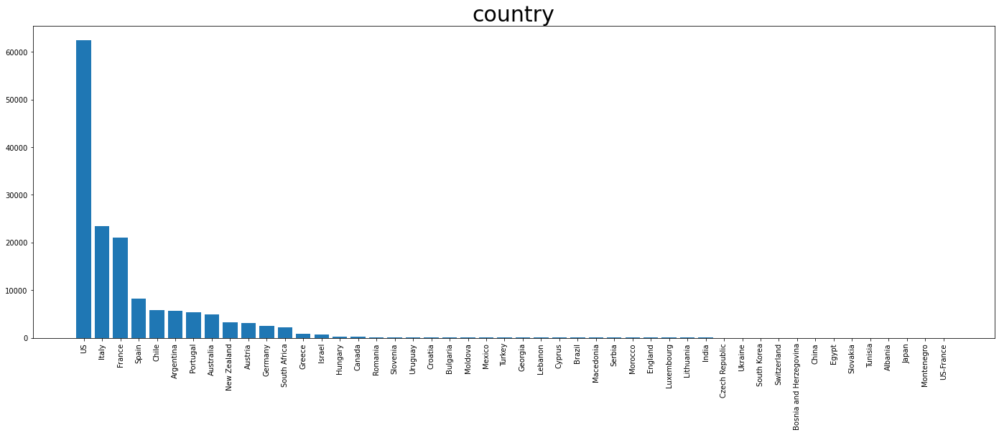

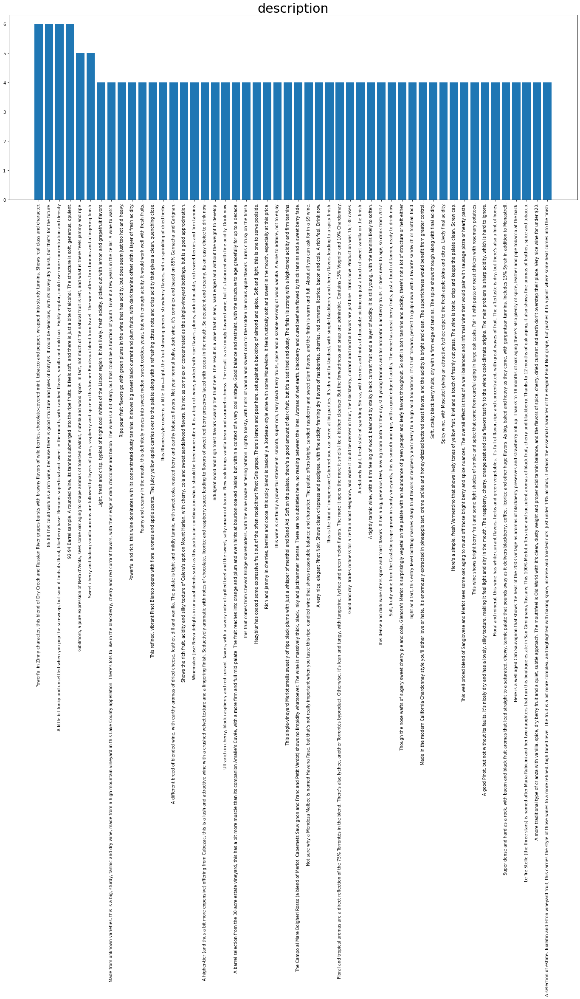

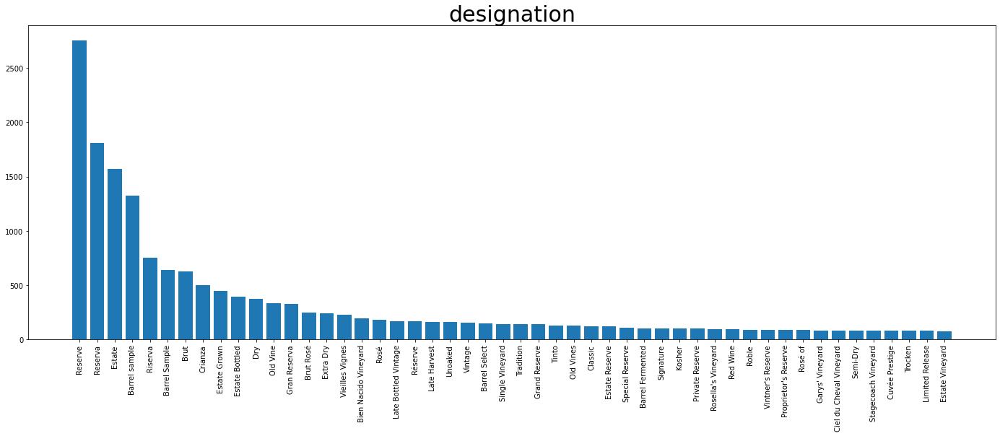

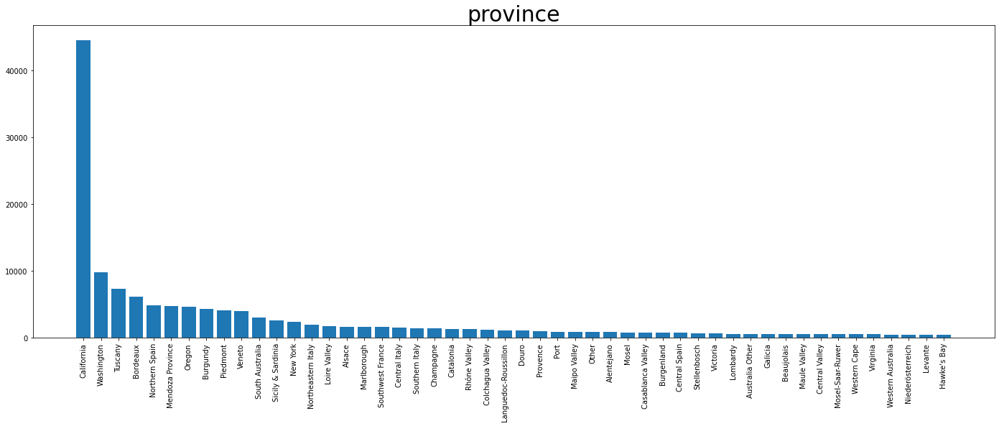

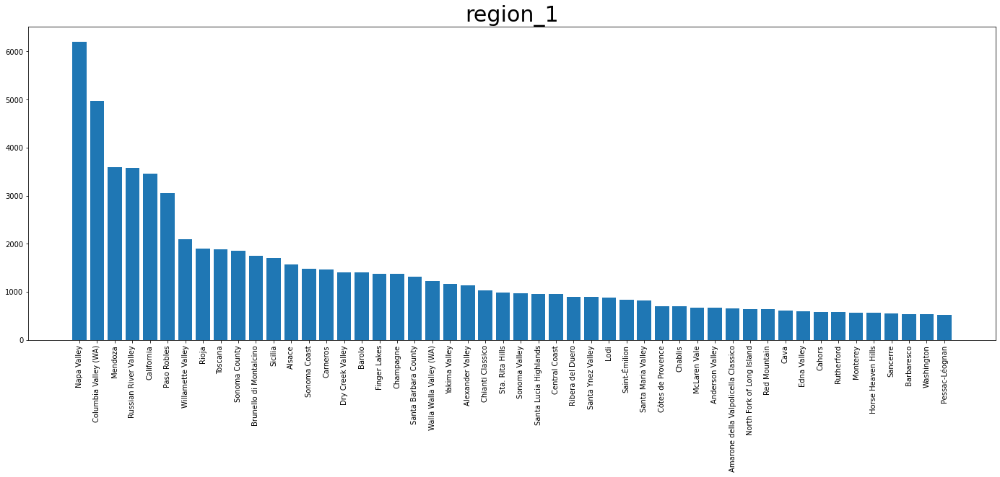

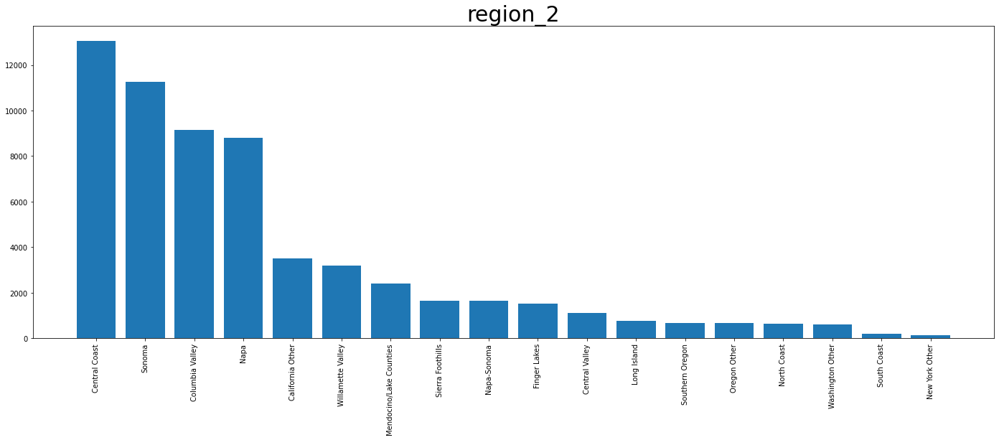

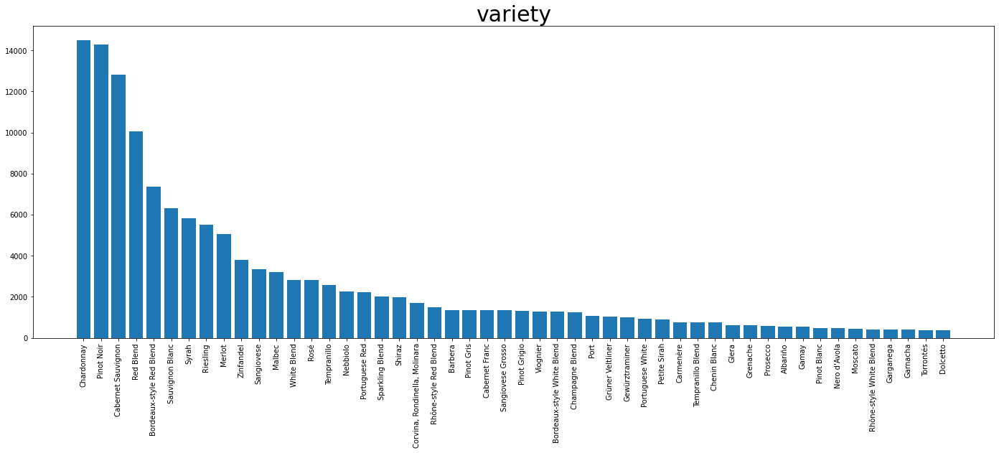

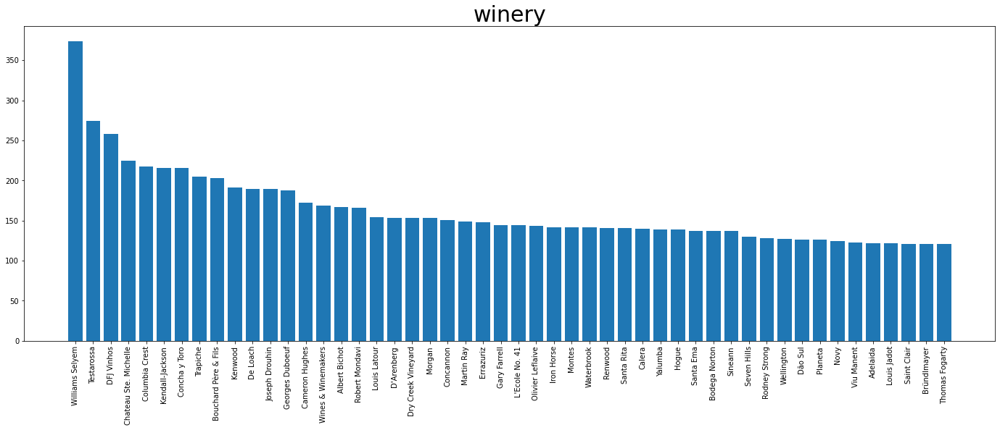

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 90.0000 	Max: 100.0000
Missing: 0

descriptive statistics (price):
Min: 4.0000	Q1(25%): 16.0000 	Q2(50%): 24.0000 	Q3(75%): 40.0000 	Max: 2300.0000
Missing: 13695



/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


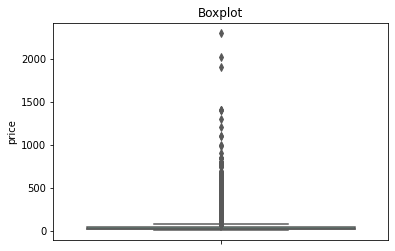

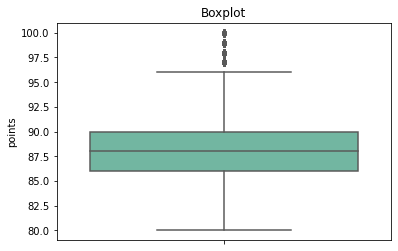

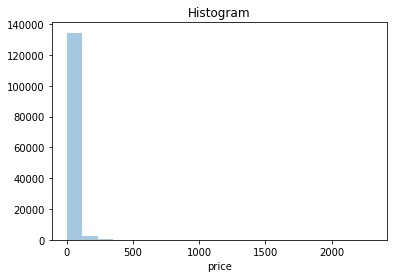

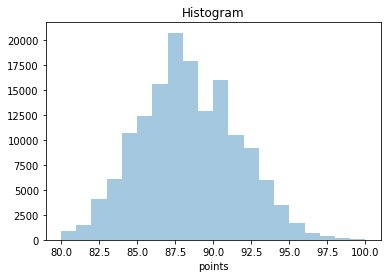

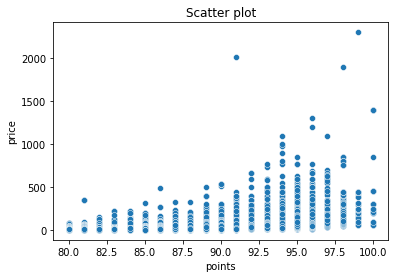

In [ ]:
# Nominal index
nominal_index = ['country','description', 'designation', 'province', 'region_1', 'region_2', 'variety', 'winery']
# Numerical index
numerical_index = ['points', 'price']
nominal_summary(winemag150k,new_df=None,nominal_index=nominal_index,head_n=50)
numerical_summary(winemag150k,new_df=None,numerical_index=numerical_index)
viz_pairs(winemag150k,xlabel='points',ylabel='price',bins=20,new_df=None)

**缺失值处理与对比**

1）将缺失值部分剔除

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150930 entries, 0 to 150929
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   country      150925 non-null  object 
 1   description  150930 non-null  object 
 2   designation  105195 non-null  object 
 3   points       150930 non-null  int64  
 4   price        137235 non-null  float64
 5   province     150925 non-null  object 
 6   region_1     125870 non-null  object 
 7   region_2     60953 non-null   object 
 8   variety      150930 non-null  object 
 9   winery       150930 non-null  object 
dtypes: float64(1), int64(1), object(8)
memory usage: 12.7+ MB
None
(150930, 10)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39241 entries, 0 to 150916
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   country      39241 non-null  object 
 1   description  39241 non-null  object 
 2   designat

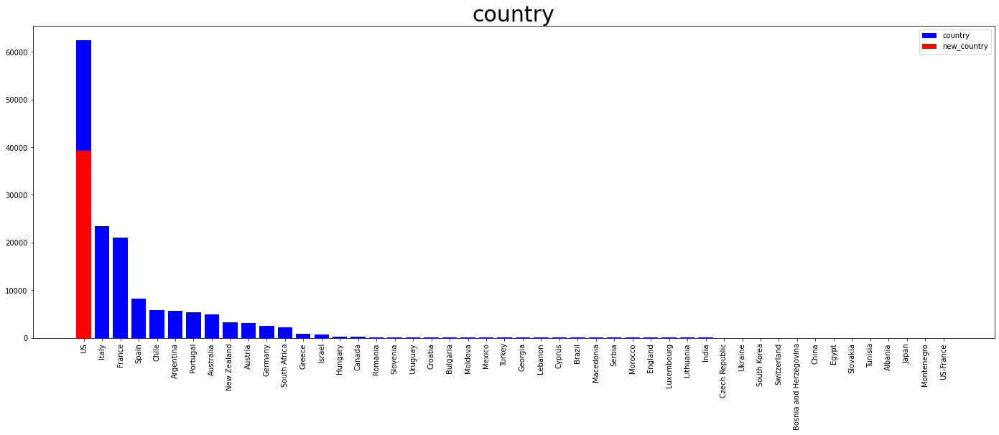

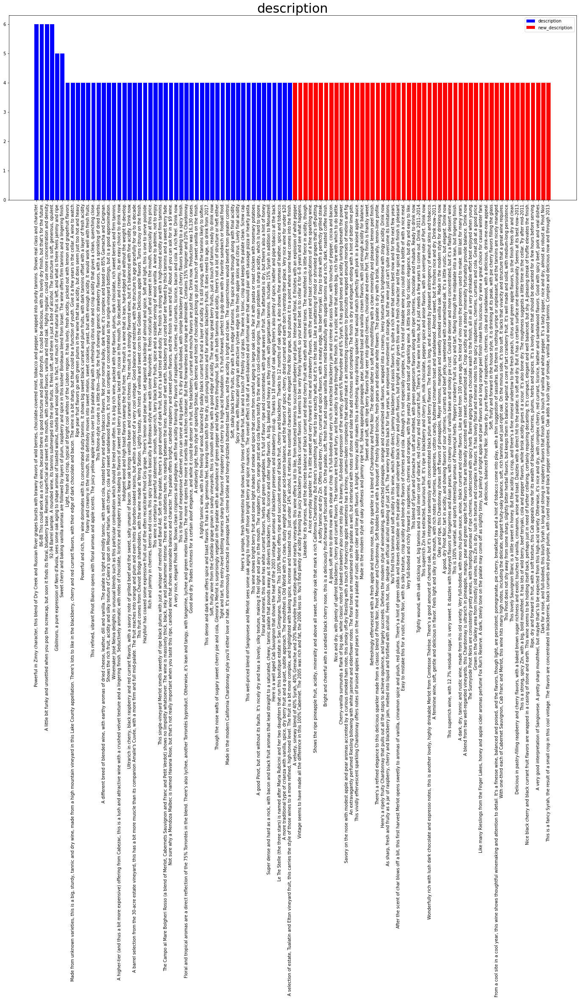

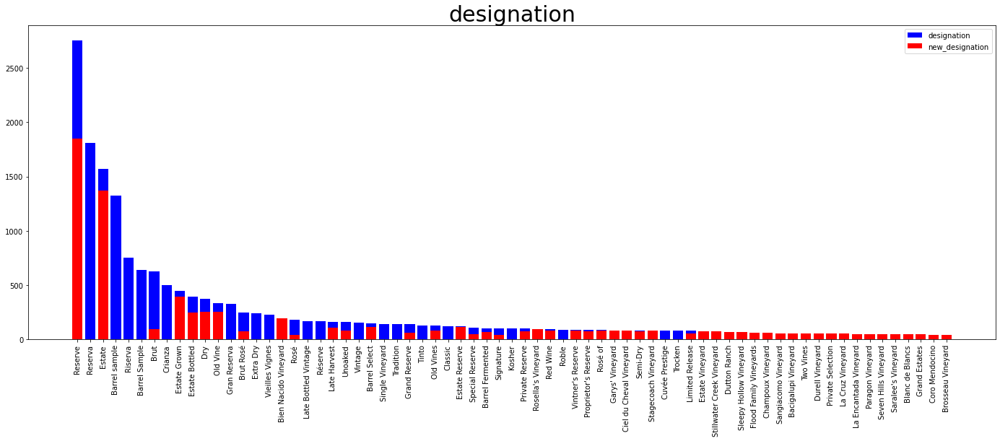

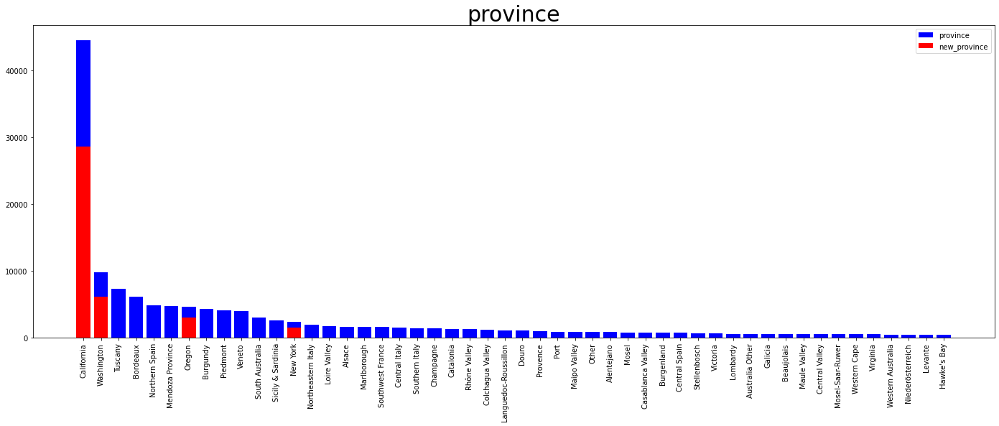

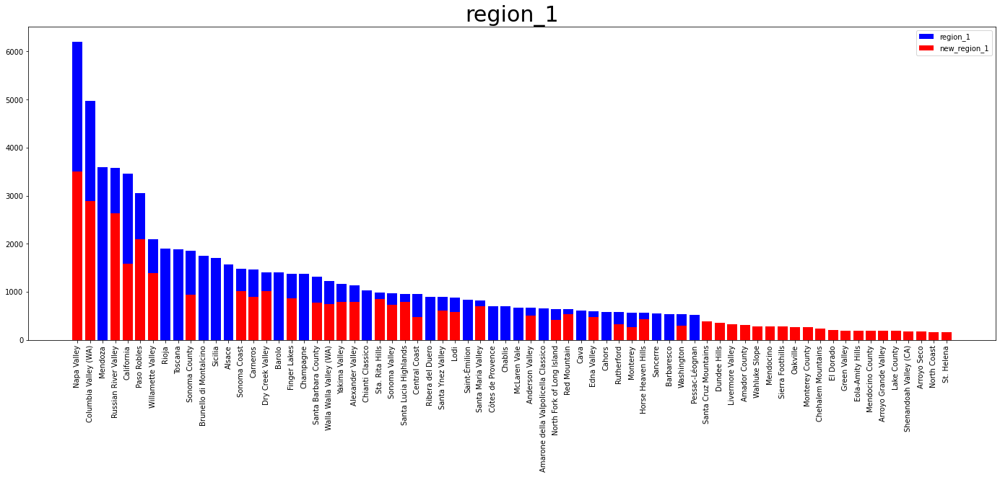

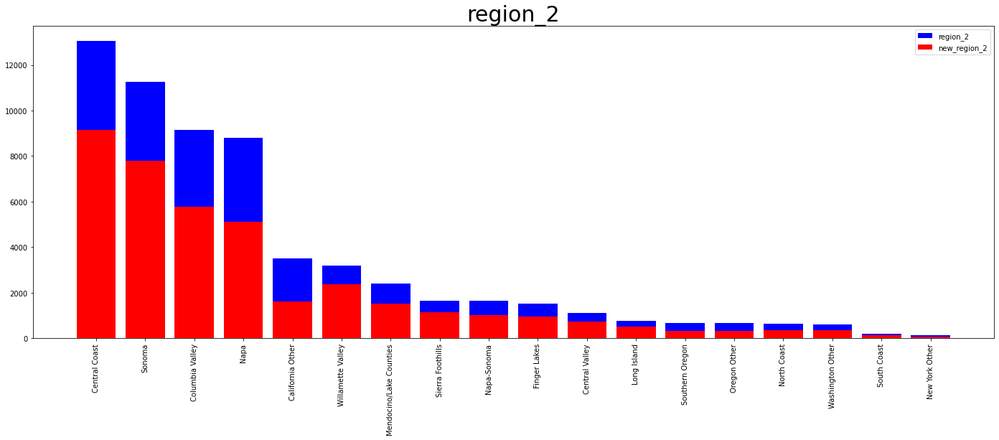

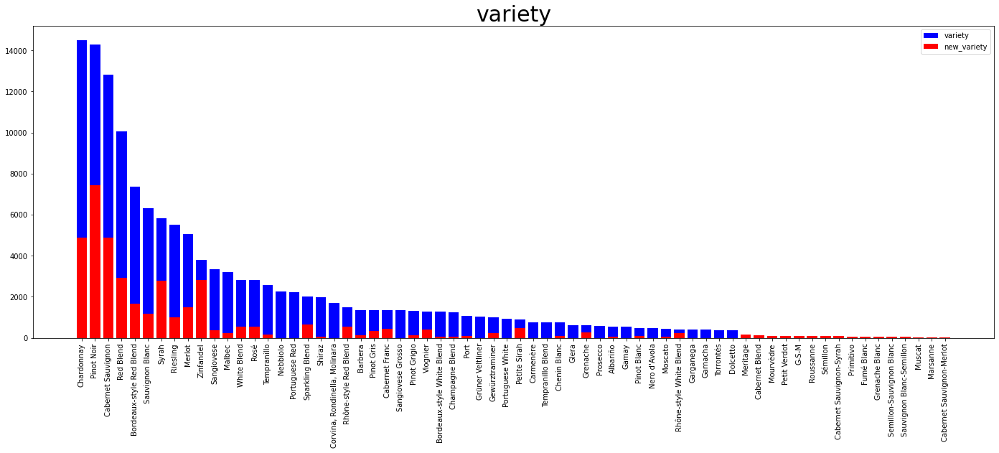

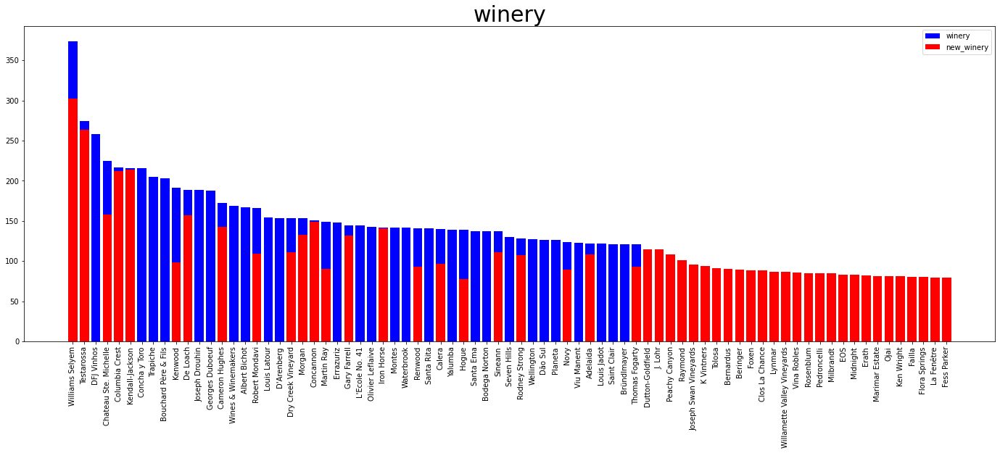

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 90.0000 	Max: 100.0000
Missing: 0

 new Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000 
 new Missing: 111689 

descriptive statistics (price):
Min: 4.0000	Q1(25%): 16.0000 	Q2(50%): 24.0000 	Q3(75%): 40.0000 	Max: 2300.0000
Missing: 13695

 new Min: 4.0000	Q1(25%): 22.0000 	Q2(50%): 32.0000 	Q3(75%): 45.0000 	Max: 2013.0000 
 new Missing: 111689 



/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


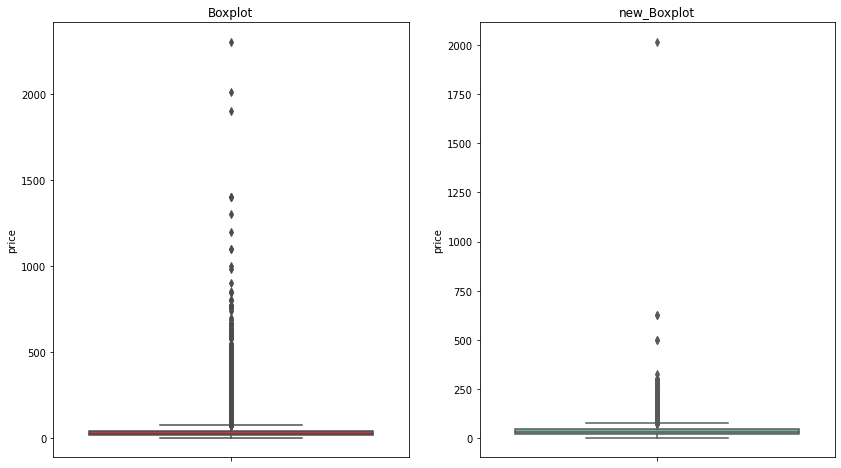

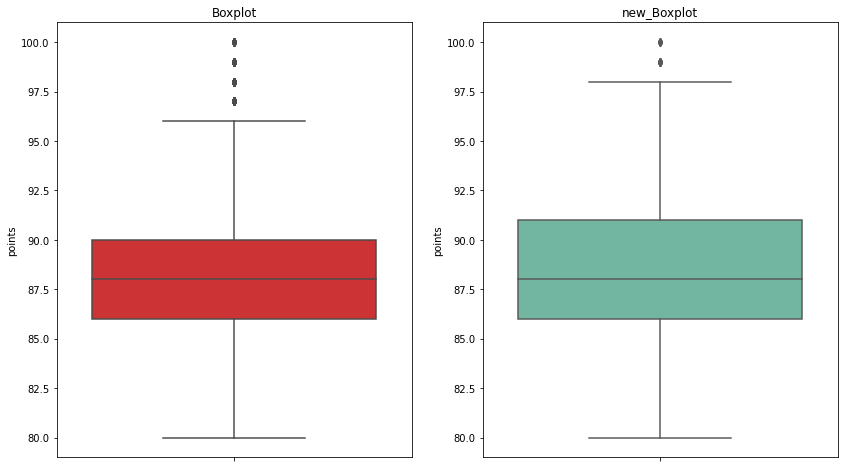

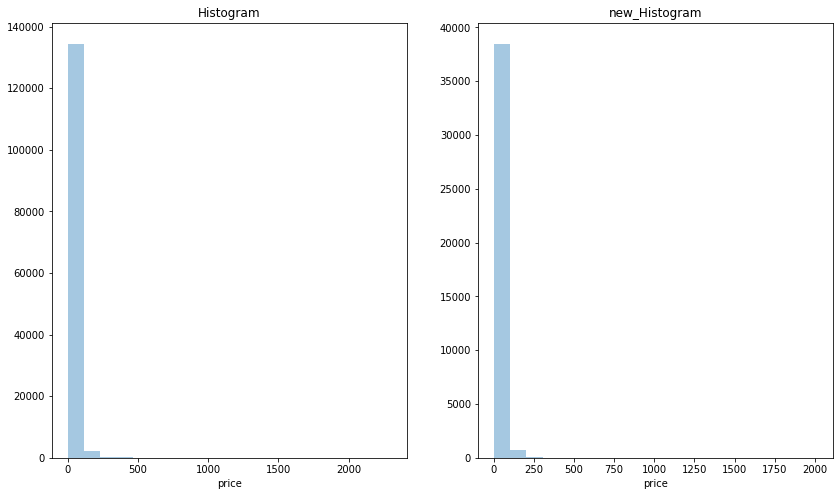

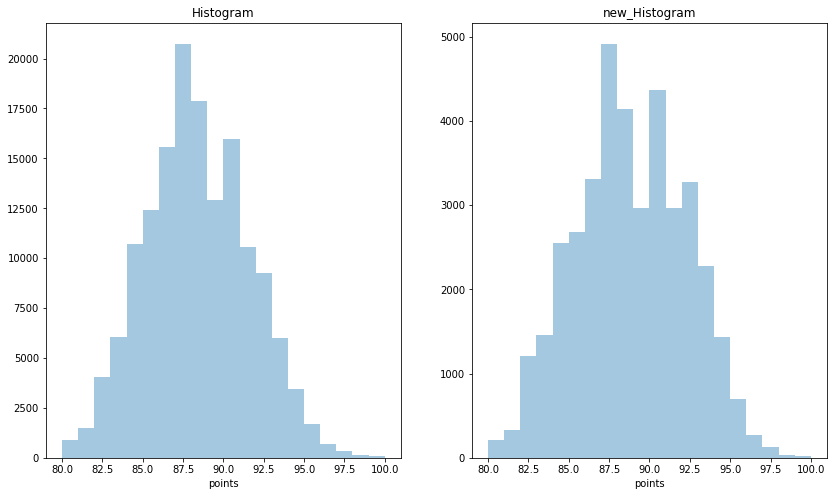

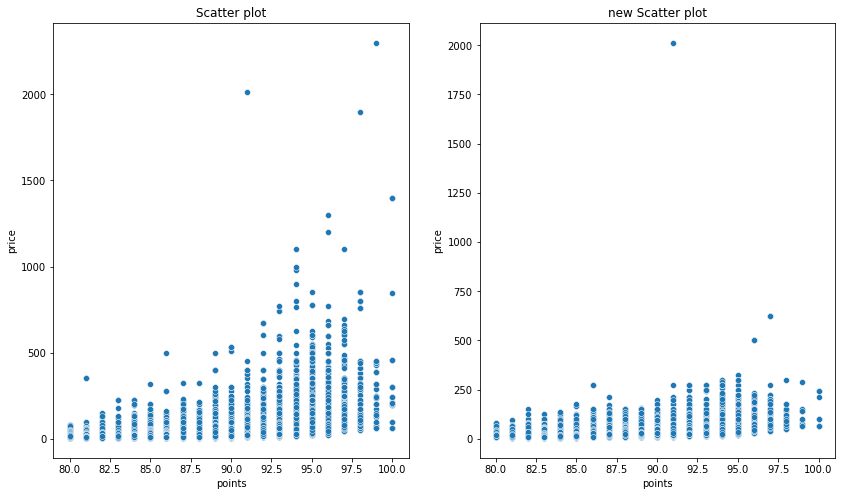

In [ ]:
dw150k=miss_drop(winemag150k)
columns_info(winemag150k,show_shape=True,new_df=dw150k)
nominal_summary(winemag150k,nominal_index=nominal_index,head_n=50,new_df=dw150k)
numerical_summary(winemag150k,numerical_index=numerical_index,new_df=dw150k)
viz_pairs(winemag150k,xlabel='points',ylabel='price',bins=20,new_df=dw150k)

2）用最高频率值来填补缺失值

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150930 entries, 0 to 150929
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   country      150925 non-null  object 
 1   description  150930 non-null  object 
 2   designation  105195 non-null  object 
 3   points       150930 non-null  int64  
 4   price        137235 non-null  float64
 5   province     150925 non-null  object 
 6   region_1     125870 non-null  object 
 7   region_2     60953 non-null   object 
 8   variety      150930 non-null  object 
 9   winery       150930 non-null  object 
dtypes: float64(1), int64(1), object(8)
memory usage: 12.7+ MB
None
(150930, 10)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150930 entries, 0 to 150929
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   country      150930 non-null  object 
 1   description  150930 non-null  object 
 2   des

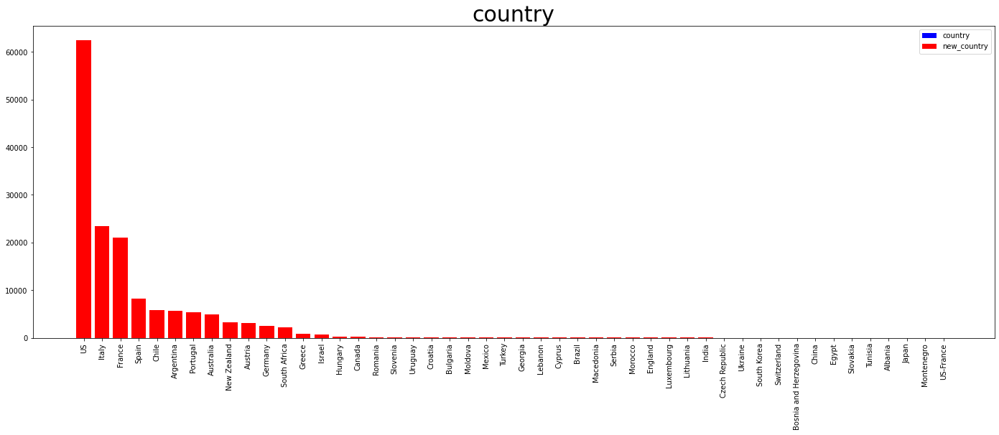

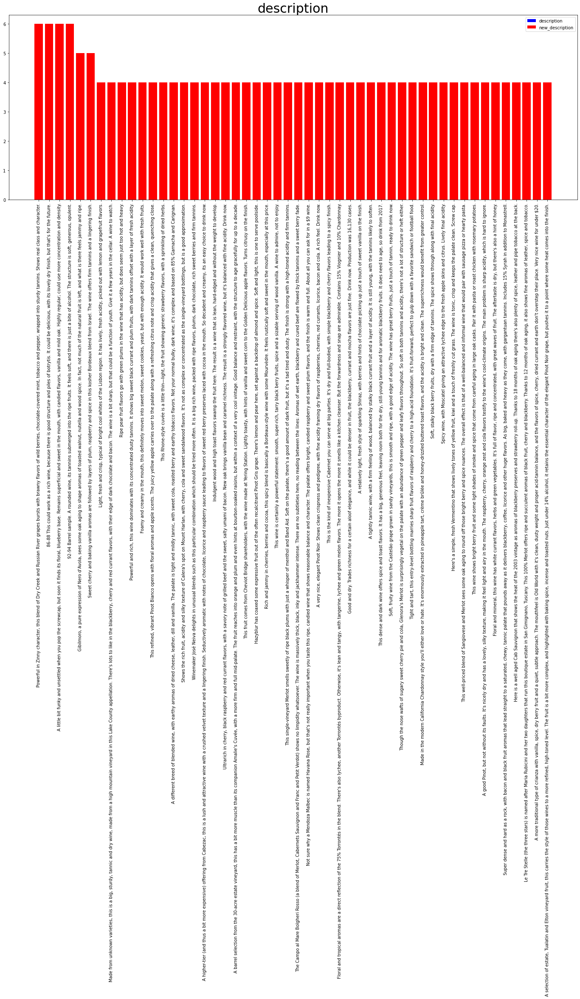

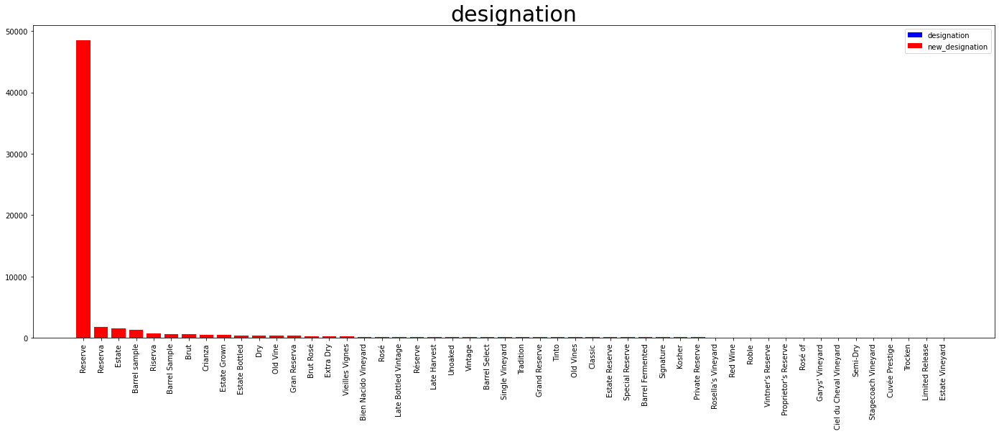

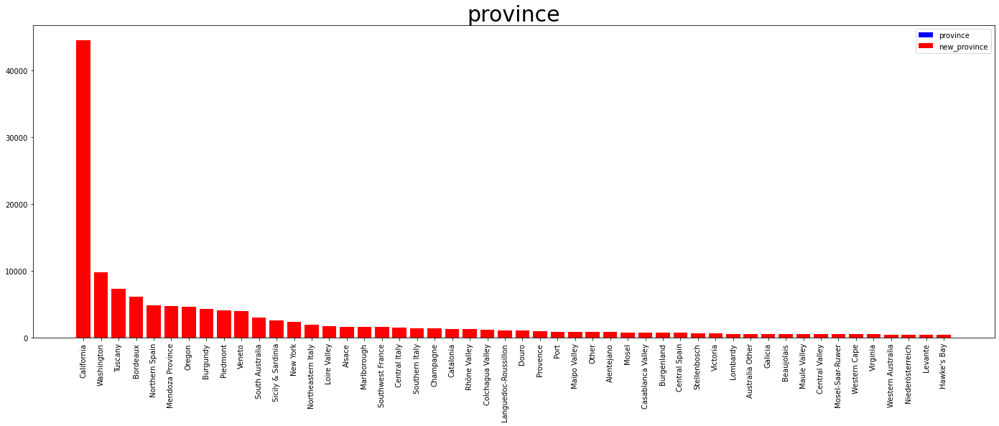

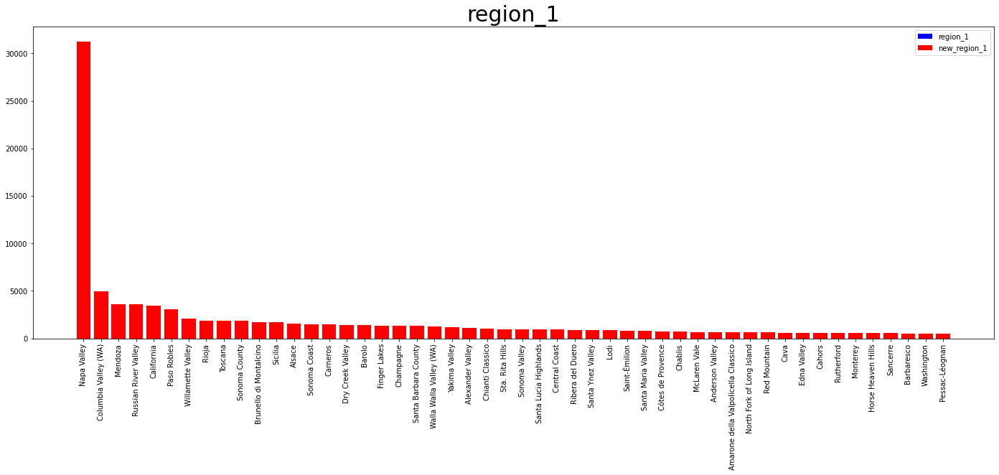

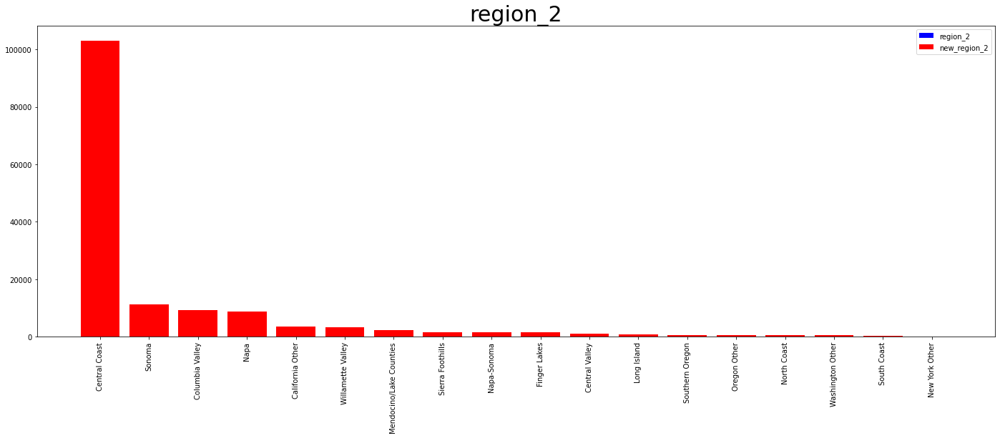

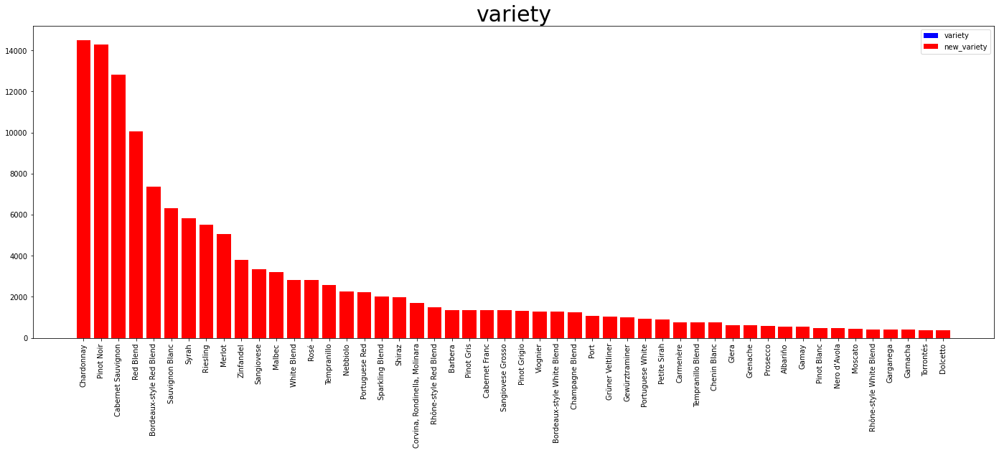

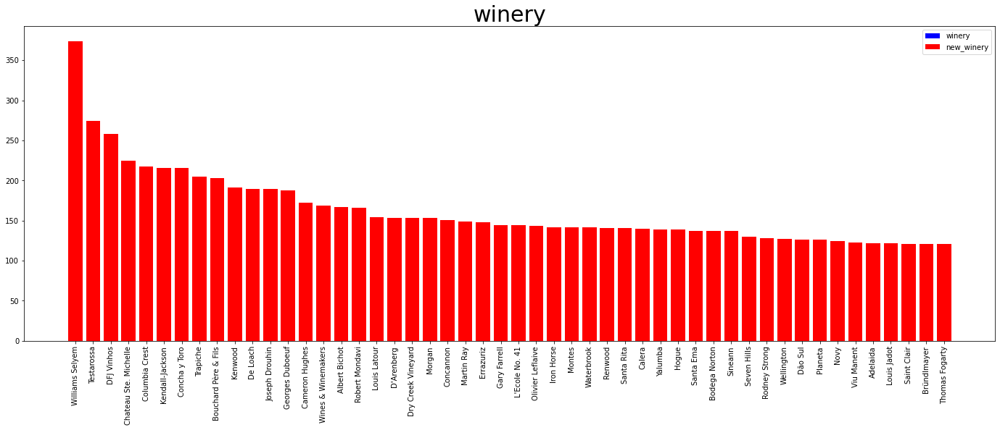

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 90.0000 	Max: 100.0000
Missing: 0

 new Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 90.0000 	Max: 100.0000 
 new Missing: 0 

descriptive statistics (price):
Min: 4.0000	Q1(25%): 16.0000 	Q2(50%): 24.0000 	Q3(75%): 40.0000 	Max: 2300.0000
Missing: 13695

 new Min: 4.0000	Q1(25%): 16.0000 	Q2(50%): 22.0000 	Q3(75%): 38.0000 	Max: 2300.0000 
 new Missing: 0 



/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


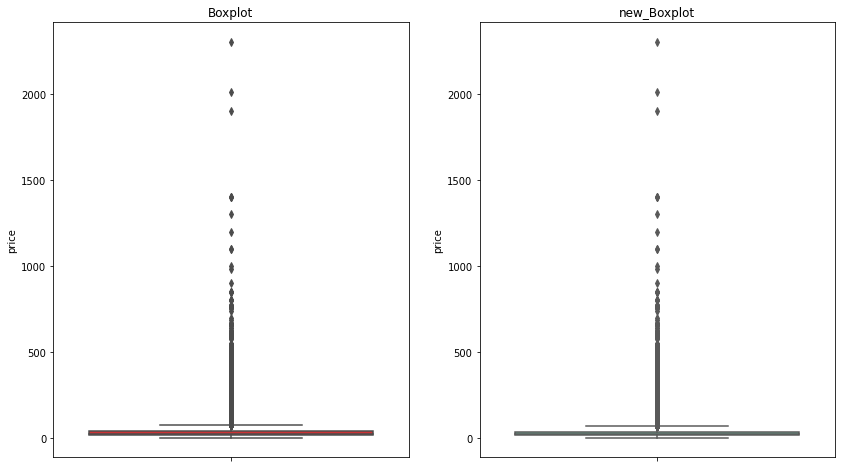

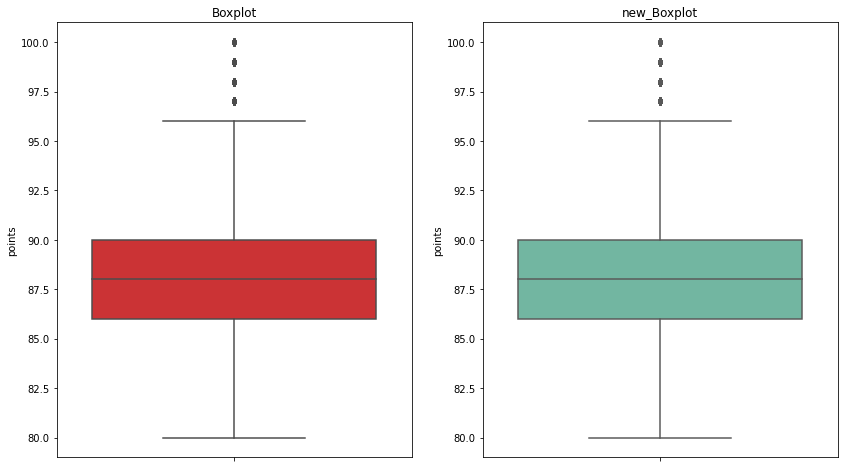

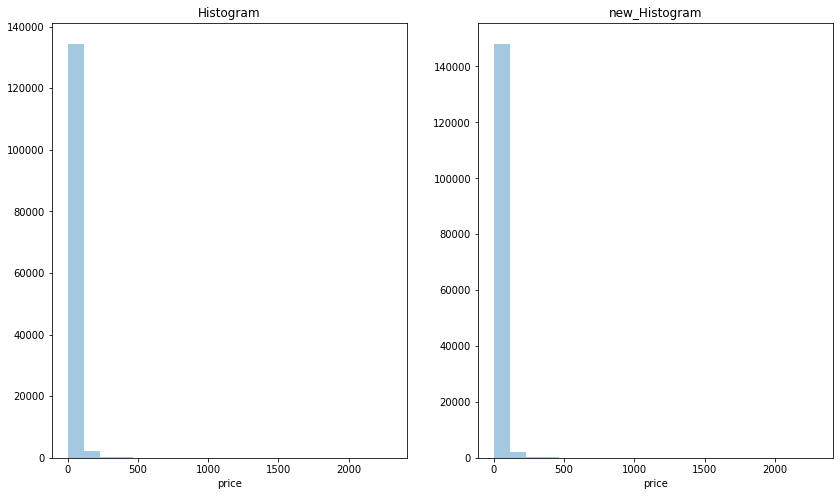

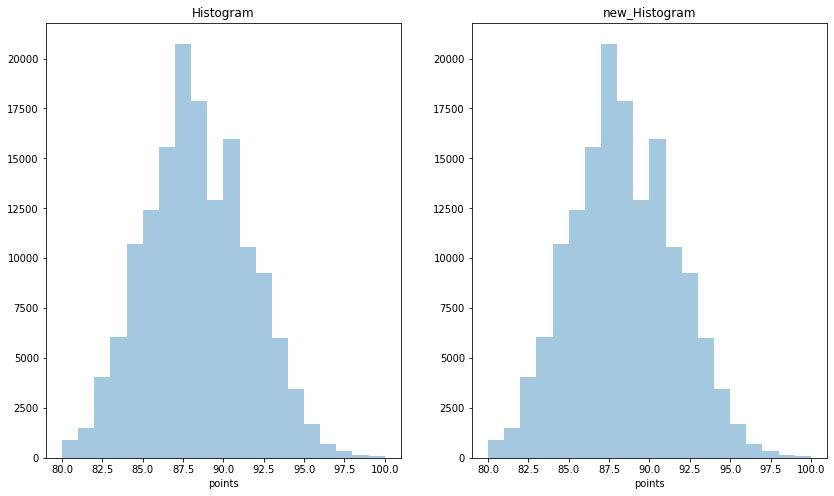

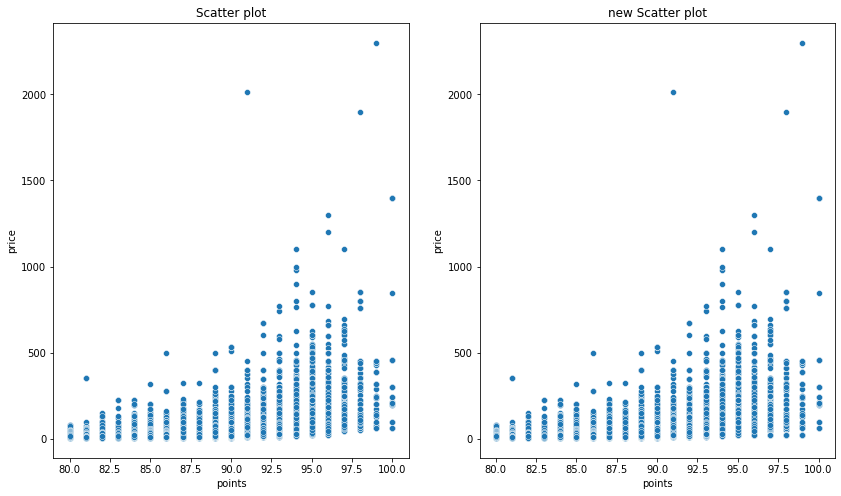

In [ ]:
md150k=miss_mode_fill(winemag150k)
columns_info(winemag150k,show_shape=True,new_df=md150k)
nominal_summary(winemag150k,nominal_index=nominal_index,head_n=50,new_df=md150k)
numerical_summary(winemag150k,numerical_index=numerical_index,new_df=md150k)
viz_pairs(winemag150k,xlabel='points',ylabel='price',bins=20,new_df=md150k)

3）通过属性的相关关系来填补缺失值

In [ ]:
miss_index=['country','designation','price','province','region_1','region_2']
comp_index=['description','points','variety','winery']
att150k=attr_corr_fill(winemag150k,miss_index=miss_index,complete_index=comp_index)
columns_info(winemag150k,show_shape=True,new_df=att150k)
nominal_summary(winemag150k,nominal_index=nominal_index,head_n=50,new_df=att150k)
numerical_summary(winemag150k,numerical_index=numerical_index,new_df=att150k)
viz_pairs(winemag150k,xlabel='points',ylabel='price',bins=20,new_df=att150k)

KeyboardInterrupt: ignored

4）通过数据对象之间的相似性来填补缺失值

In [ ]:
objcbg=obj_corr_fill(cbg_patterns,numerical_index=numerical_index,k=10)
columns_info(cbg_patterns,show_shape=True,new_df=objcbg)
nominal_summary(cbg_patterns,nominal_index=nominal_index,head_n=50,new_df=objcbg)
numerical_summary(cbg_patterns,numerical_index=numerical_index,new_df=objcbg)
viz_pairs(cbg_patterns,xlabel=numerical_index[4],ylabel=numerical_index[5],bins=20,new_df=objcbg)

winemag-data-130k-v2.csv

In [ ]:
wine_reviews_dir = "./wine_review"
winemag130k=pd.read_csv(wine_reviews_dir+"/winemag-data-130k-v2.csv",sep=',',header='infer',index_col=0)
columns_info(winemag130k)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 129971 entries, 0 to 129970
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   country                129908 non-null  object 
 1   description            129971 non-null  object 
 2   designation            92506 non-null   object 
 3   points                 129971 non-null  int64  
 4   price                  120975 non-null  float64
 5   province               129908 non-null  object 
 6   region_1               108724 non-null  object 
 7   region_2               50511 non-null   object 
 8   taster_name            103727 non-null  object 
 9   taster_twitter_handle  98758 non-null   object 
 10  title                  129971 non-null  object 
 11  variety                129970 non-null  object 
 12  winery                 129971 non-null  object 
dtypes: float64(1), int64(1), object(11)
memory usage: 13.9+ MB
None
(129971, 13)


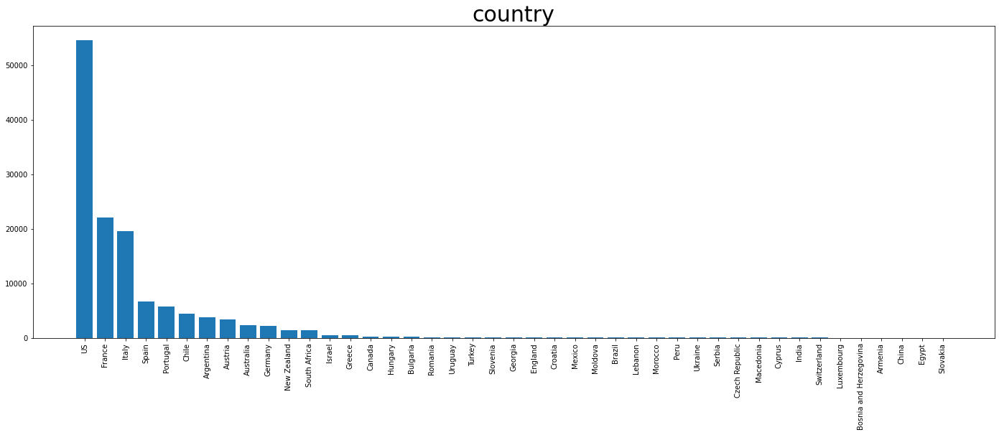

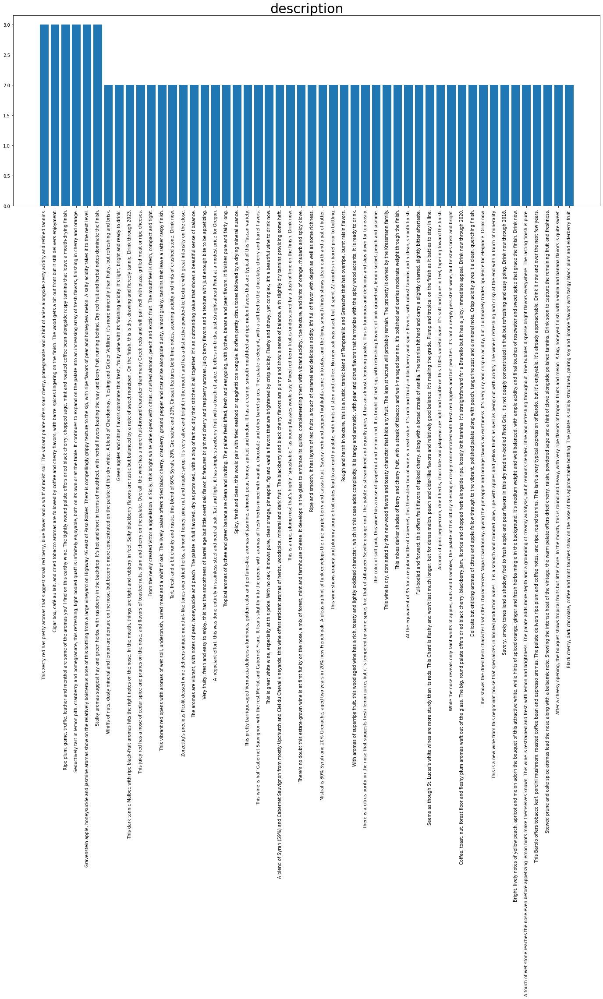

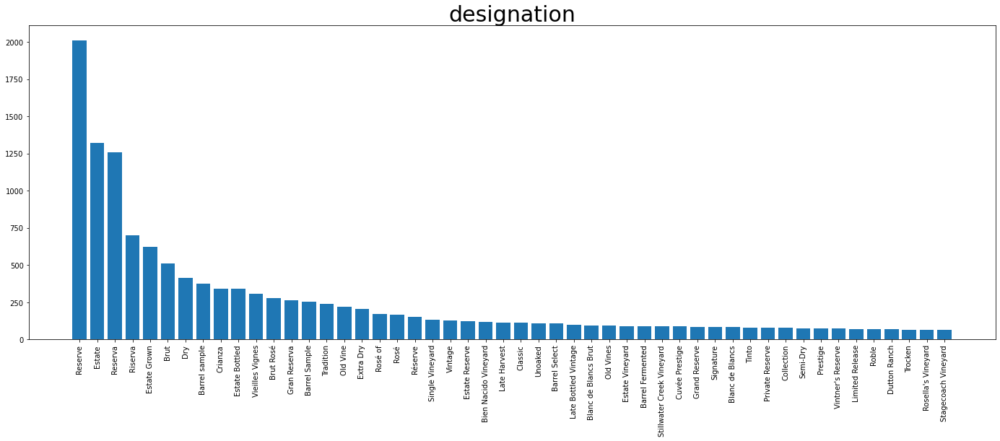

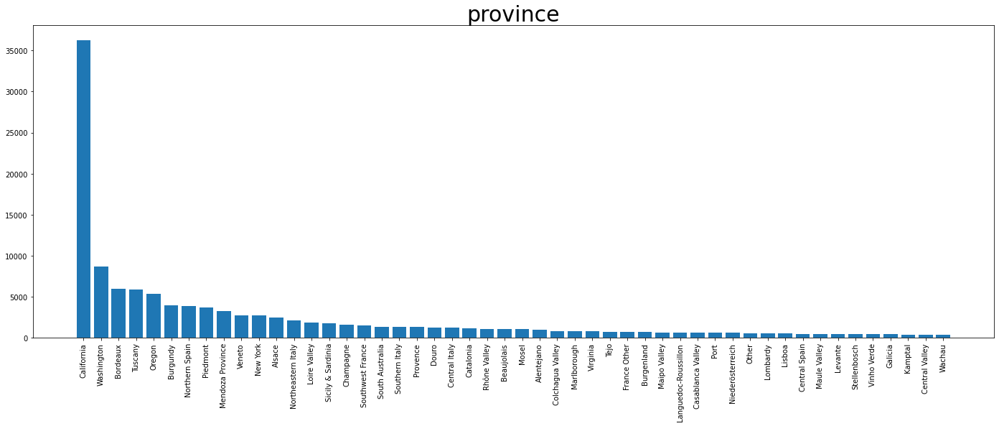

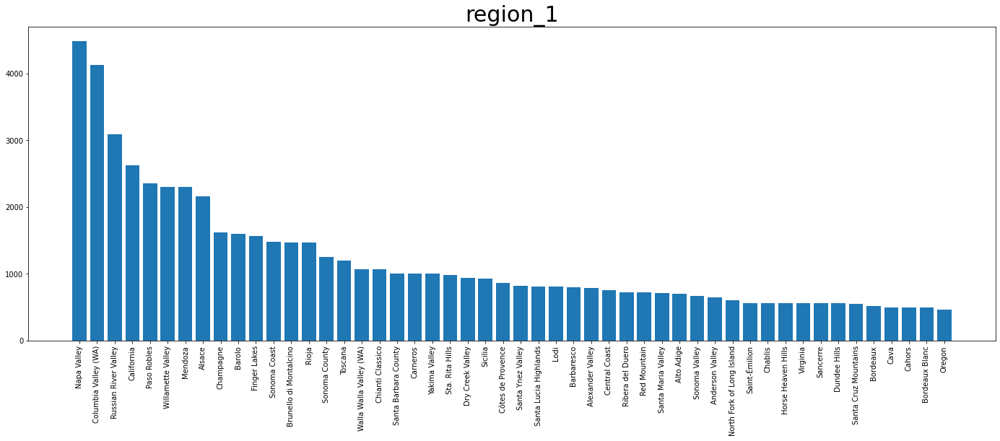

...

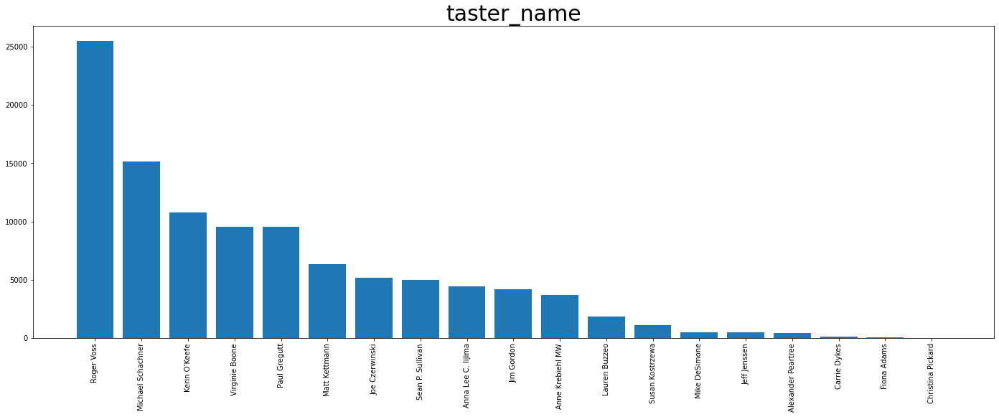

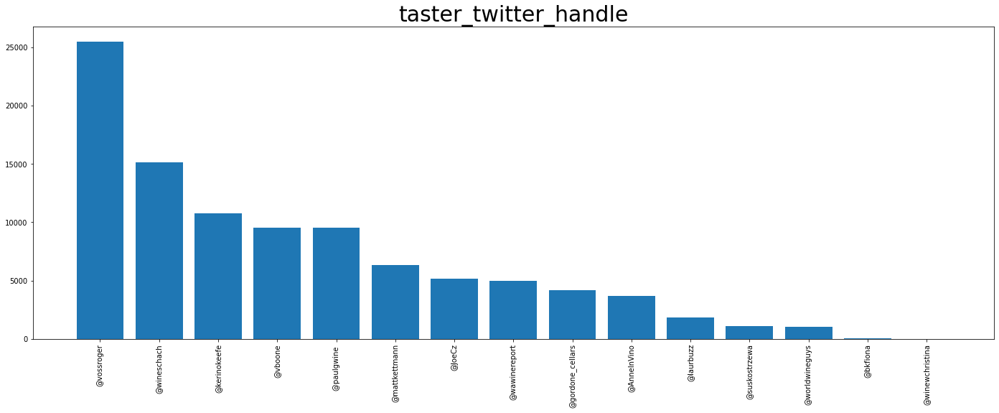

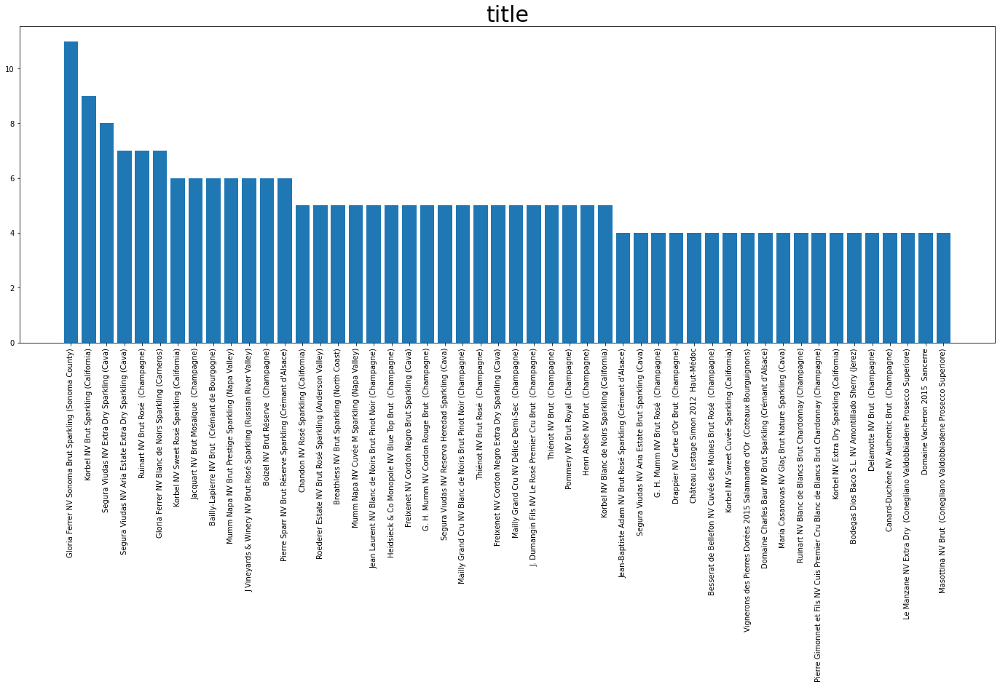

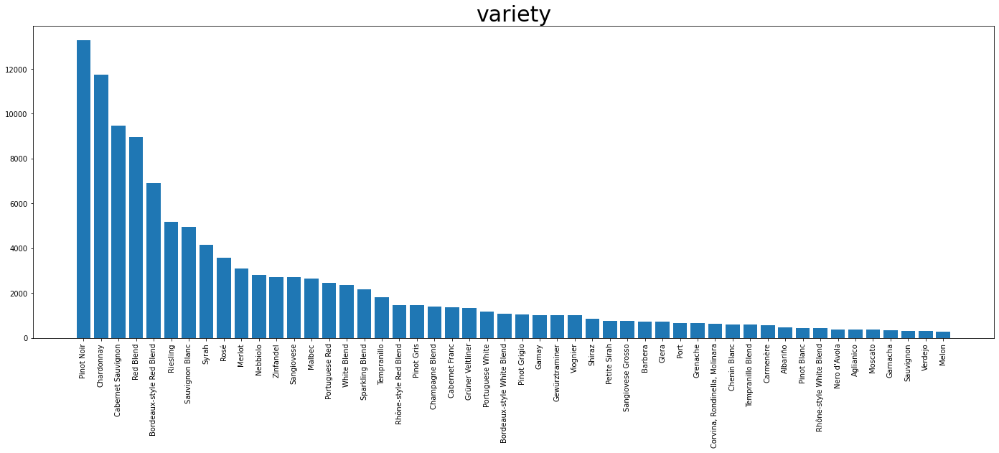

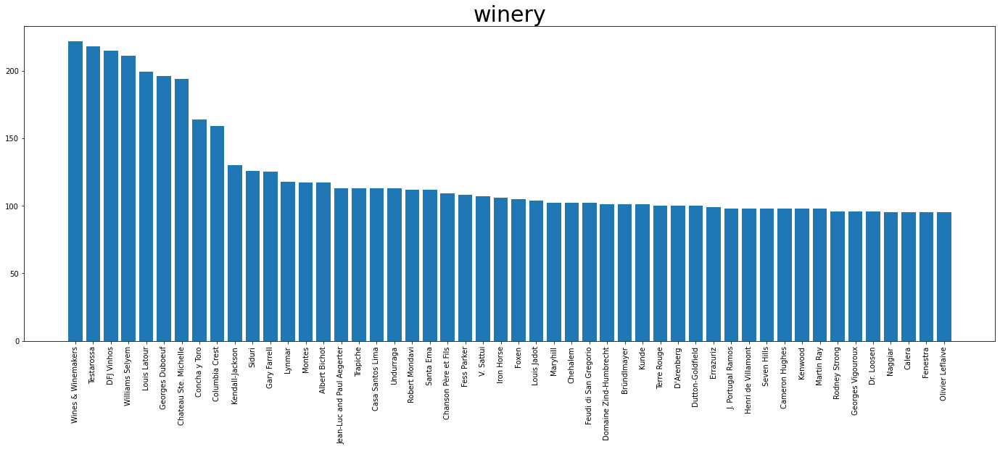

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000
Missing: 0

descriptive statistics (price):
Min: 4.0000	Q1(25%): 17.0000 	Q2(50%): 25.0000 	Q3(75%): 42.0000 	Max: 3300.0000
Missing: 8996



/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


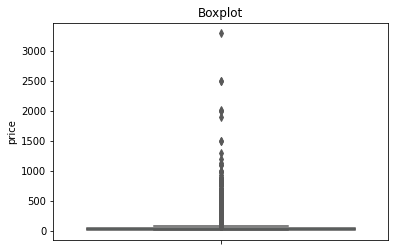

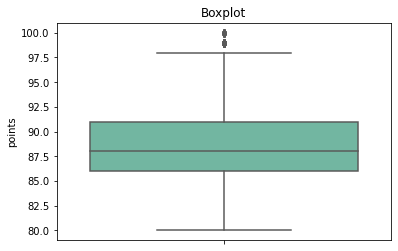

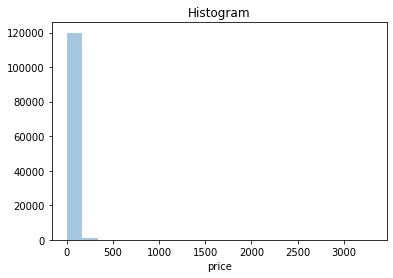

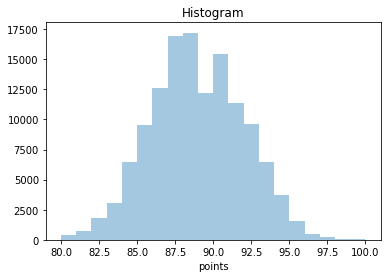

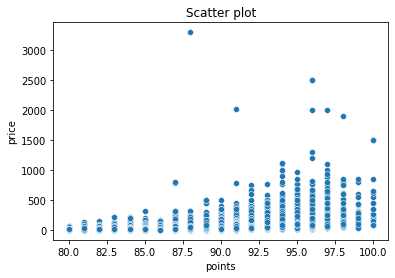

In [ ]:
# Nominal index
nominal_index = ['country','description', 'designation', 'province', 'region_1', 'region_2', 
                 'taster_name','taster_twitter_handle','title',
                 'variety', 'winery']
# Numerical index
numerical_index = ['points', 'price']
nominal_summary(winemag130k,nominal_index,head_n=50)
numerical_summary(winemag130k,numerical_index)
viz_pairs(winemag130k,xlabel='points',ylabel='price',bins=20,new_df=None)

**缺失值处理与对比**

1）将缺失值部分剔除

<class 'pandas.core.frame.DataFrame'>
Int64Index: 129971 entries, 0 to 129970
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   country                129908 non-null  object 
 1   description            129971 non-null  object 
 2   designation            92506 non-null   object 
 3   points                 129971 non-null  int64  
 4   price                  120975 non-null  float64
 5   province               129908 non-null  object 
 6   region_1               108724 non-null  object 
 7   region_2               50511 non-null   object 
 8   taster_name            103727 non-null  object 
 9   taster_twitter_handle  98758 non-null   object 
 10  title                  129971 non-null  object 
 11  variety                129970 non-null  object 
 12  winery                 129971 non-null  object 
dtypes: float64(1), int64(1), object(11)
memory usage: 13.9+ MB
None
(129971, 13)

<class 'pan

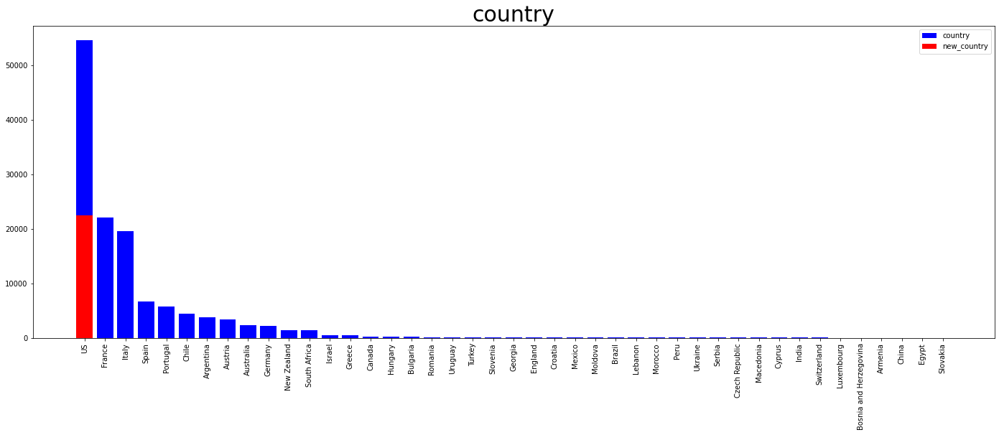

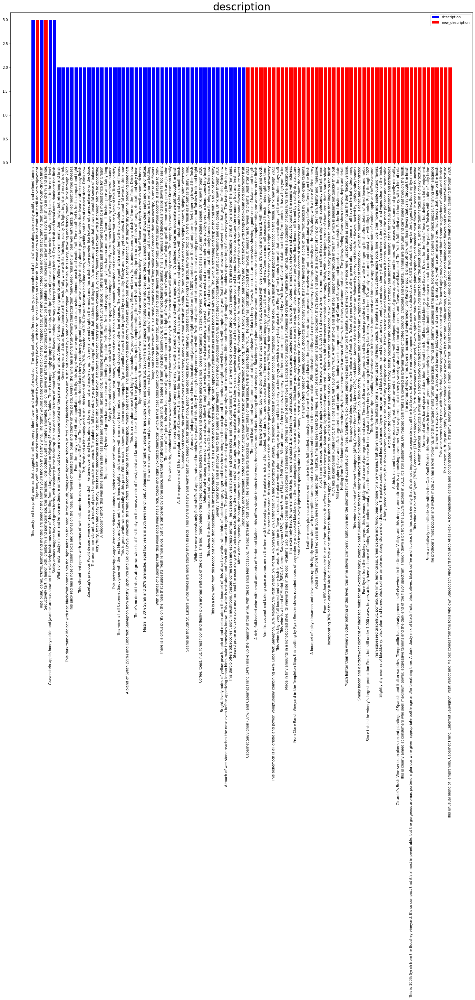

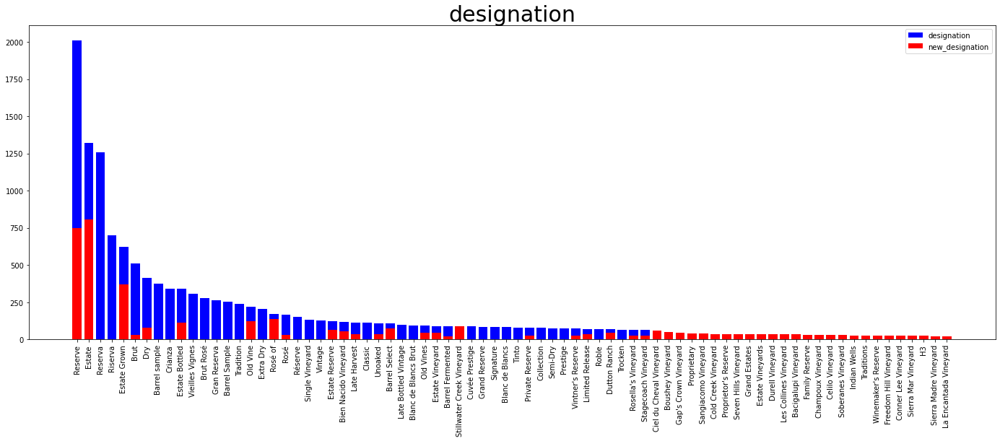

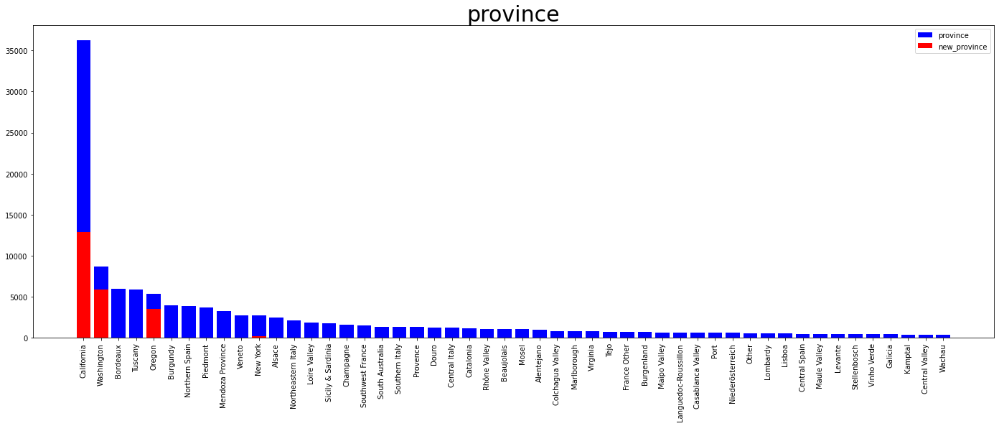

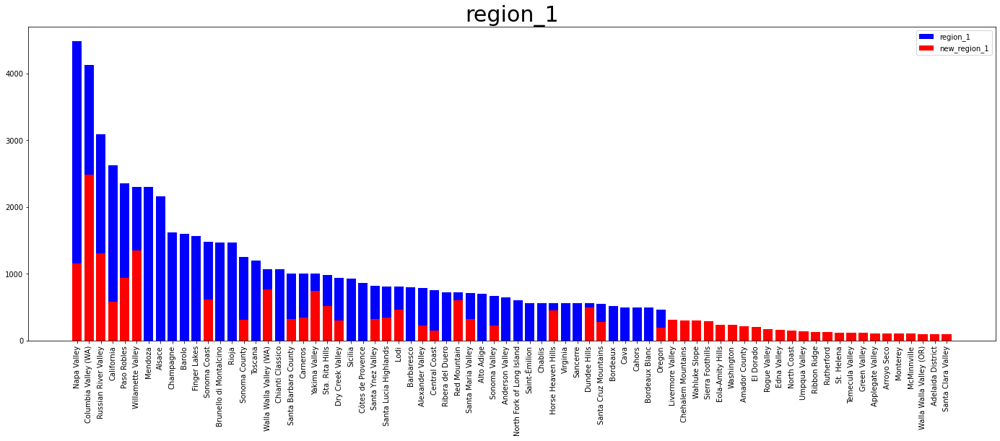

...

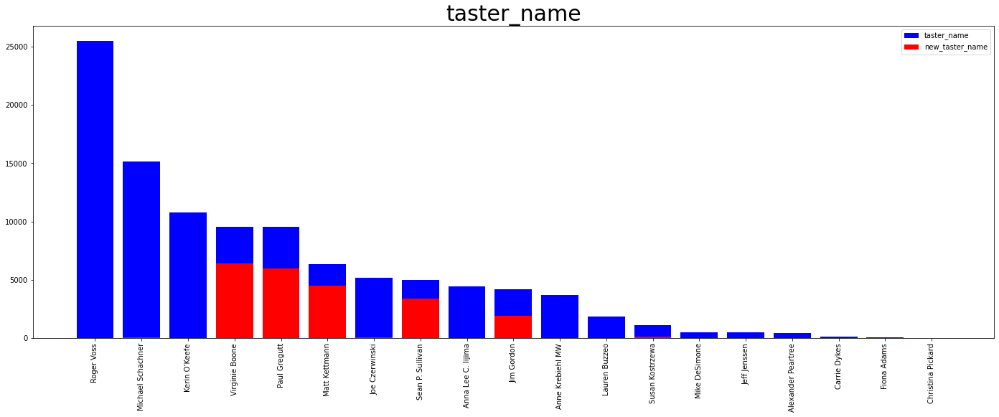

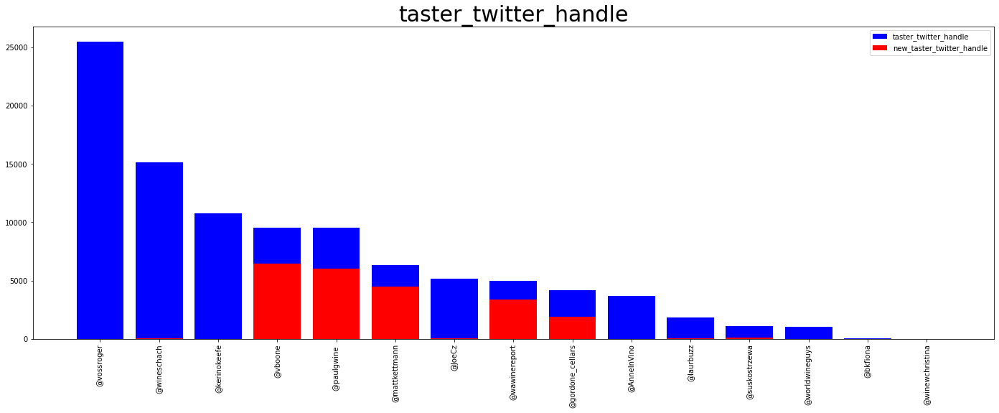

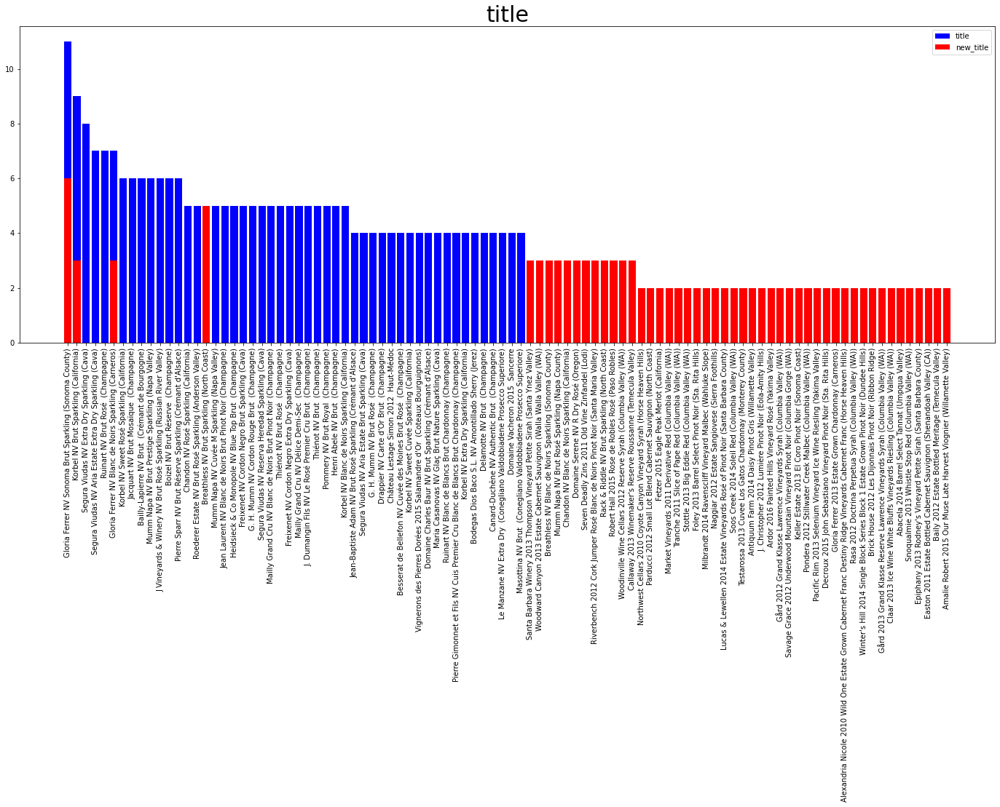

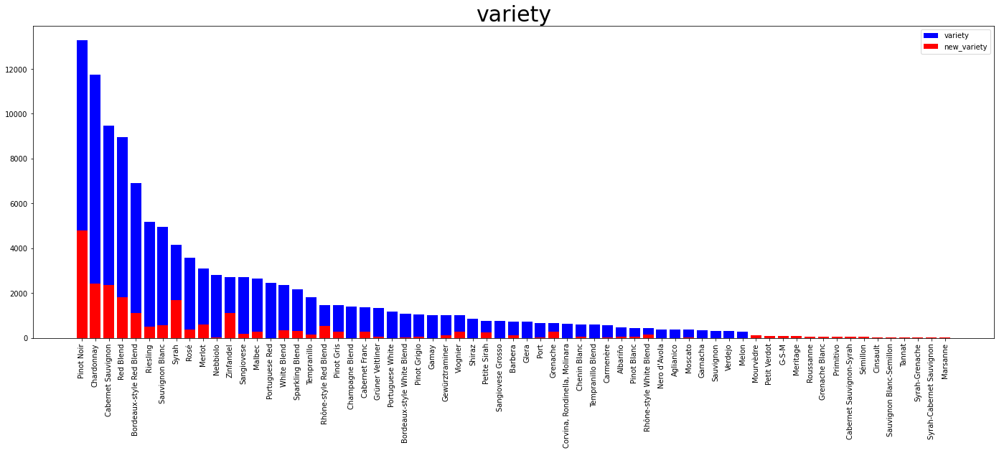

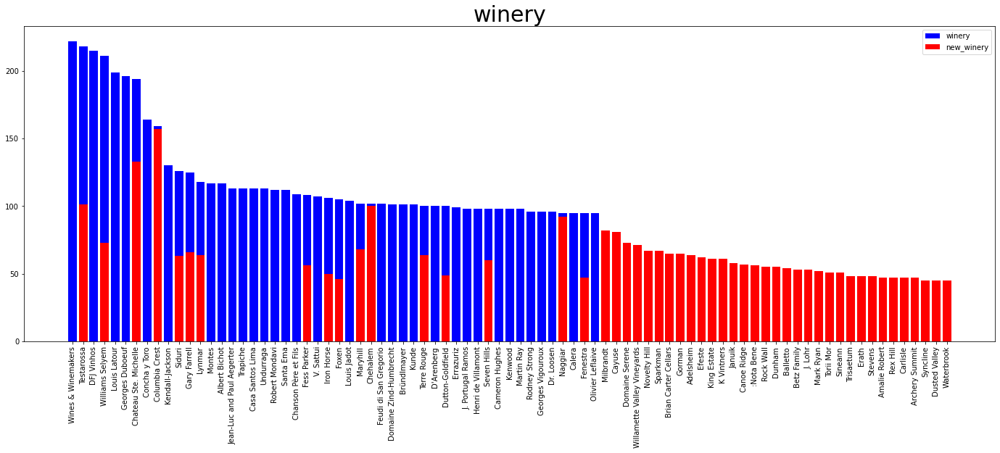

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000
Missing: 0

 new Min: 80.0000	Q1(25%): 88.0000 	Q2(50%): 90.0000 	Q3(75%): 92.0000 	Max: 100.0000 
 new Missing: 107584 

descriptive statistics (price):
Min: 4.0000	Q1(25%): 17.0000 	Q2(50%): 25.0000 	Q3(75%): 42.0000 	Max: 3300.0000
Missing: 8996

 new Min: 4.0000	Q1(25%): 25.0000 	Q2(50%): 36.0000 	Q3(75%): 50.0000 	Max: 2013.0000 
 new Missing: 107584 



/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


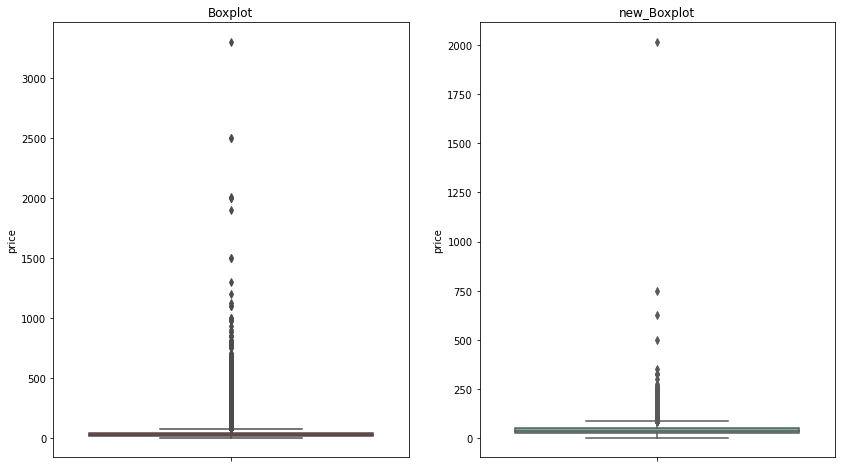

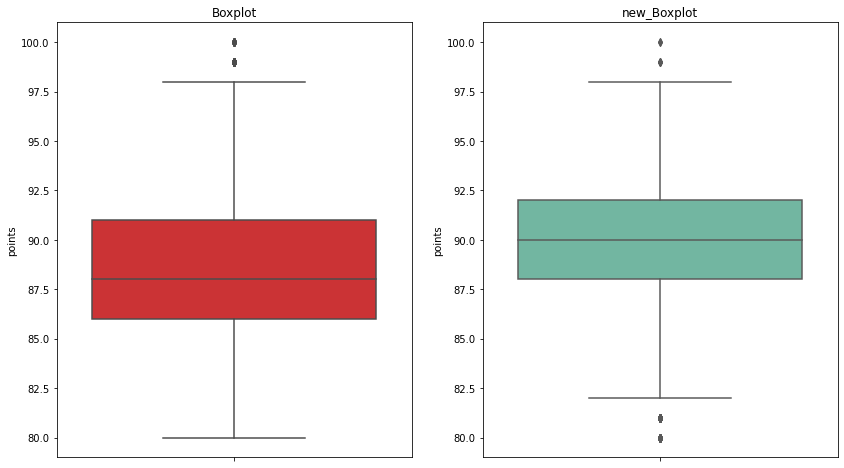

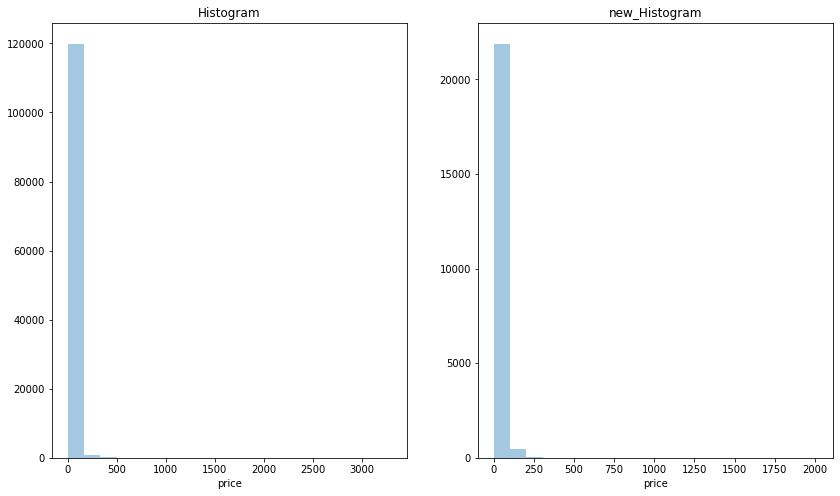

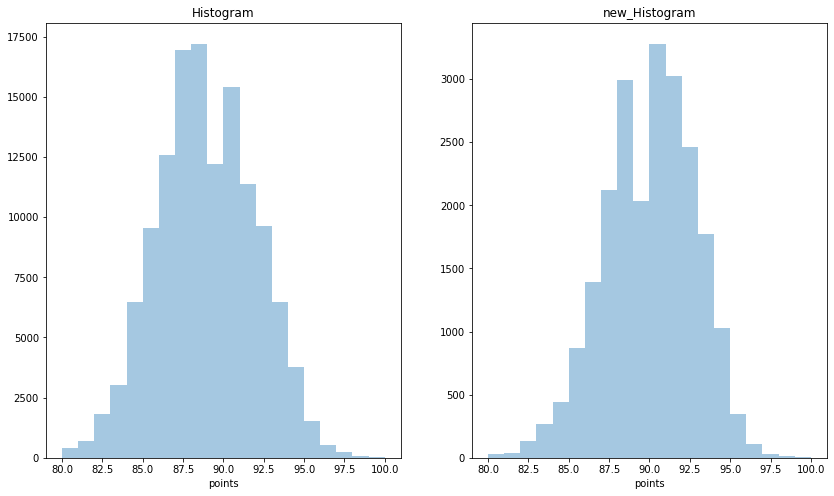

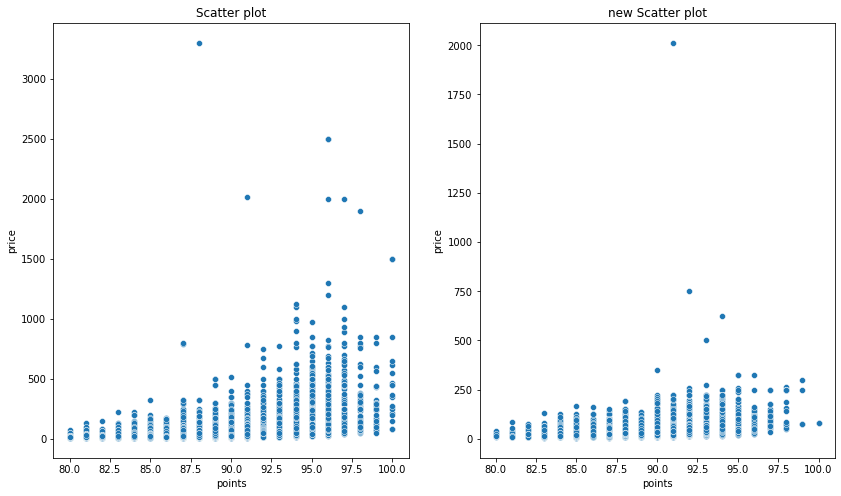

In [ ]:
dw130k=miss_drop(winemag130k)
columns_info(winemag130k,show_shape=True,new_df=dw130k)
nominal_summary(winemag130k,nominal_index=nominal_index,head_n=50,new_df=dw130k)
numerical_summary(winemag130k,numerical_index=numerical_index,new_df=dw130k)
viz_pairs(winemag130k,xlabel='points',ylabel='price',bins=20,new_df=dw130k)

2）用最高频率值来填补缺失值

<class 'pandas.core.frame.DataFrame'>
Int64Index: 129971 entries, 0 to 129970
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   country                129908 non-null  object 
 1   description            129971 non-null  object 
 2   designation            92506 non-null   object 
 3   points                 129971 non-null  int64  
 4   price                  120975 non-null  float64
 5   province               129908 non-null  object 
 6   region_1               108724 non-null  object 
 7   region_2               50511 non-null   object 
 8   taster_name            103727 non-null  object 
 9   taster_twitter_handle  98758 non-null   object 
 10  title                  129971 non-null  object 
 11  variety                129970 non-null  object 
 12  winery                 129971 non-null  object 
dtypes: float64(1), int64(1), object(11)
memory usage: 13.9+ MB
None
(129971, 13)

<class 'pan

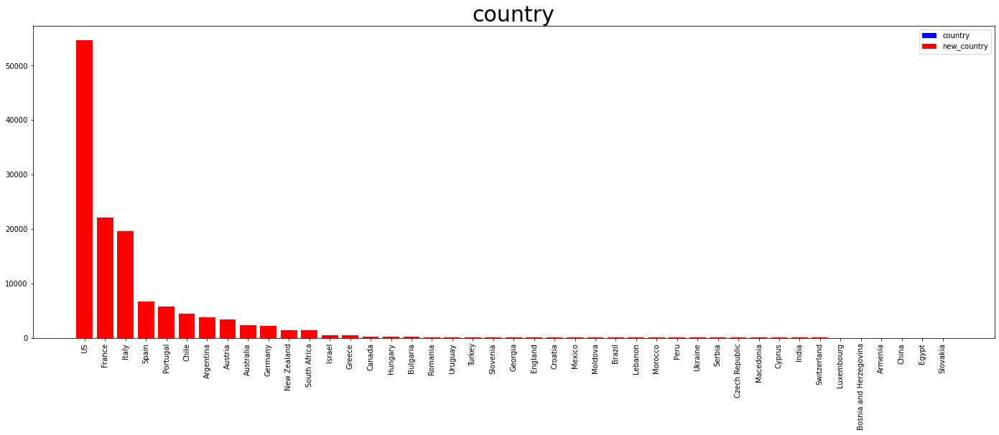

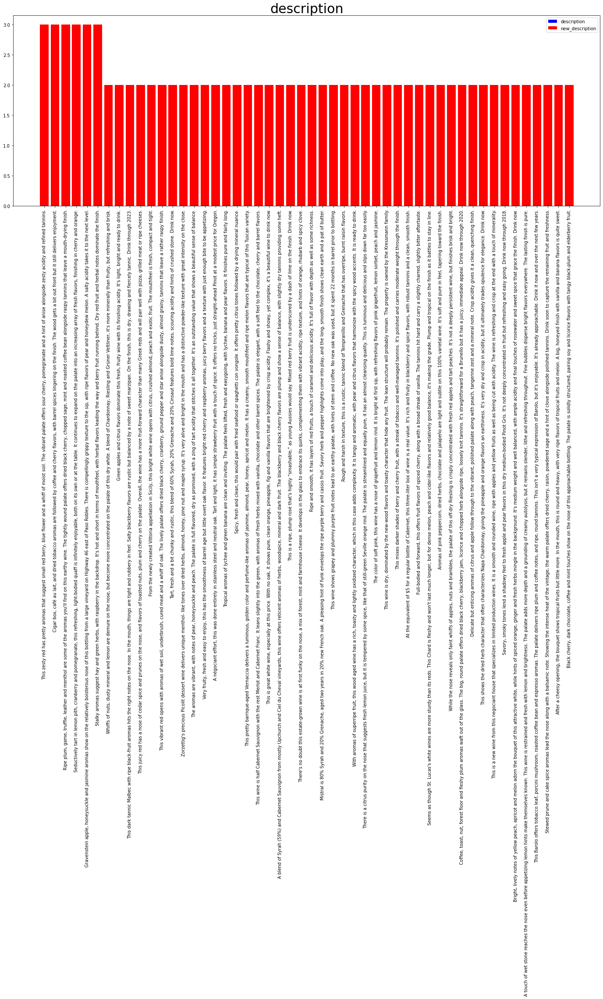

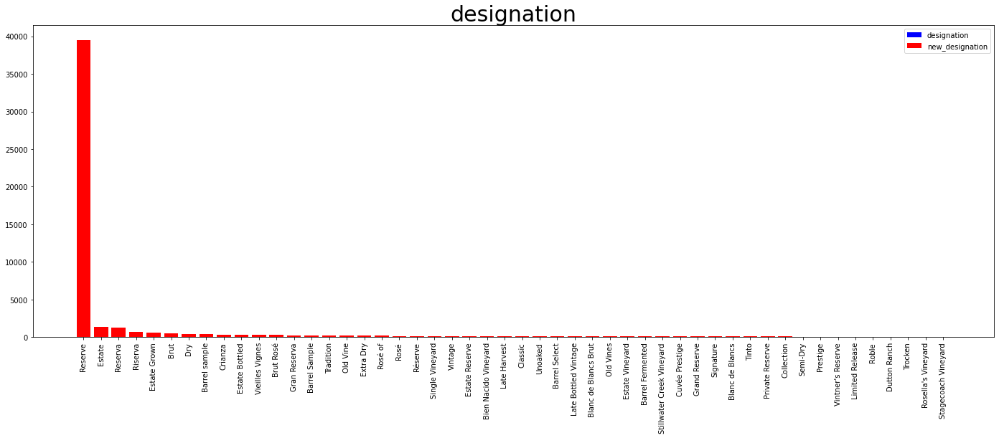

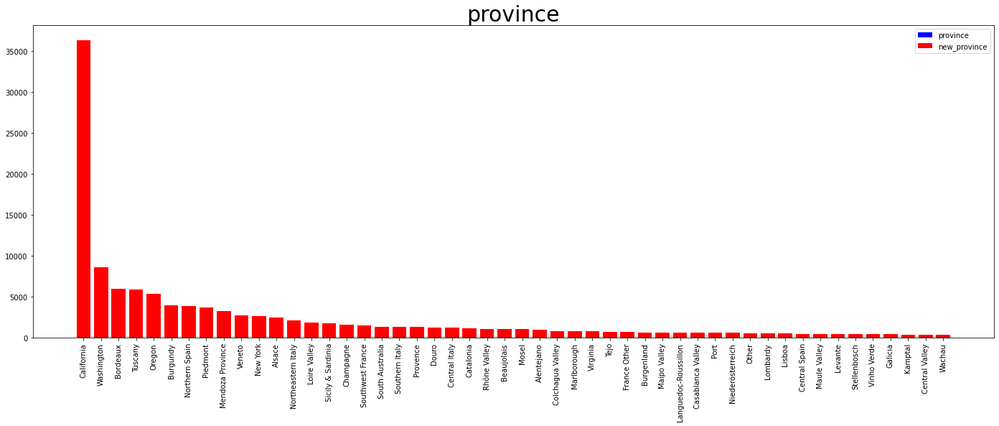

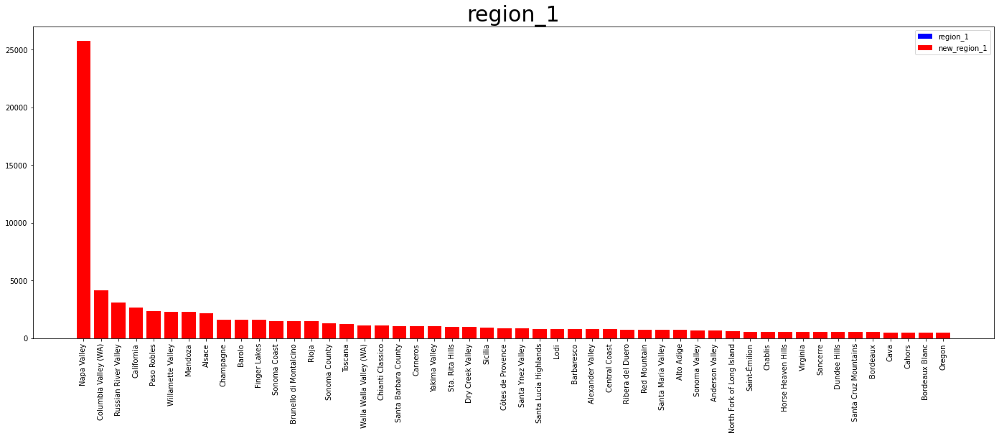

...

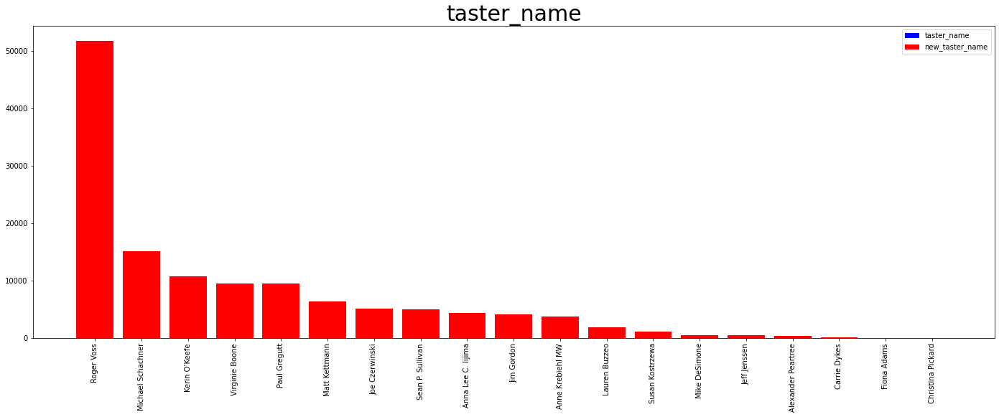

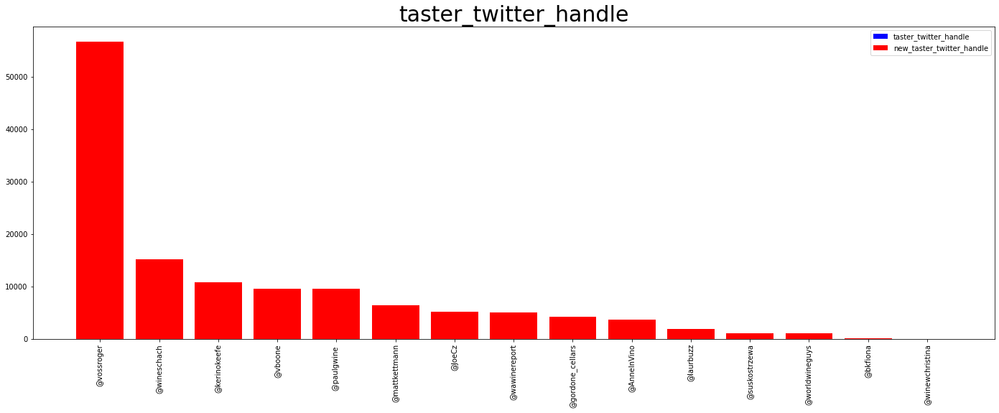

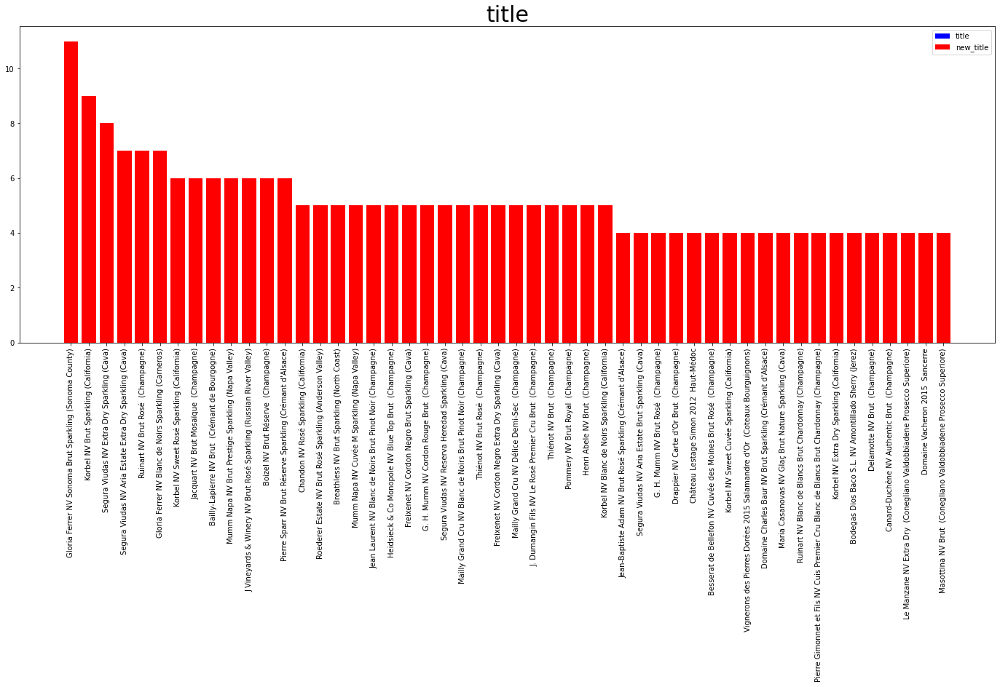

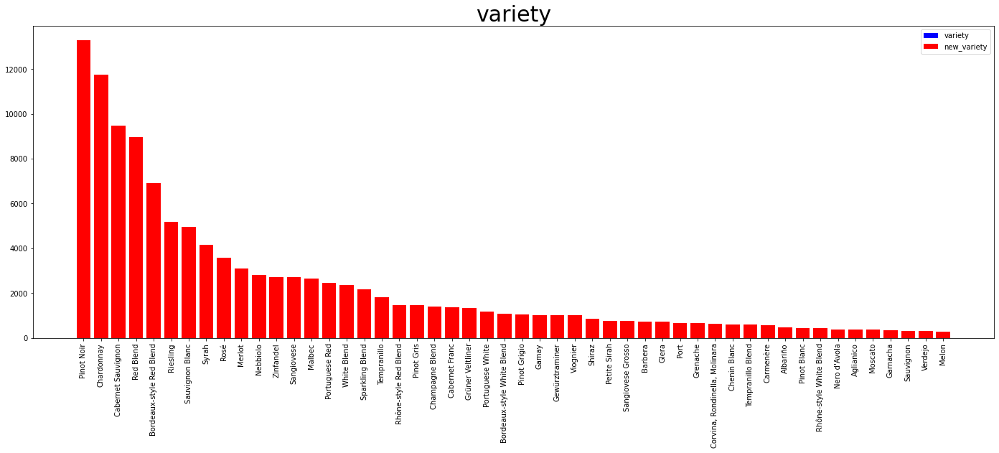

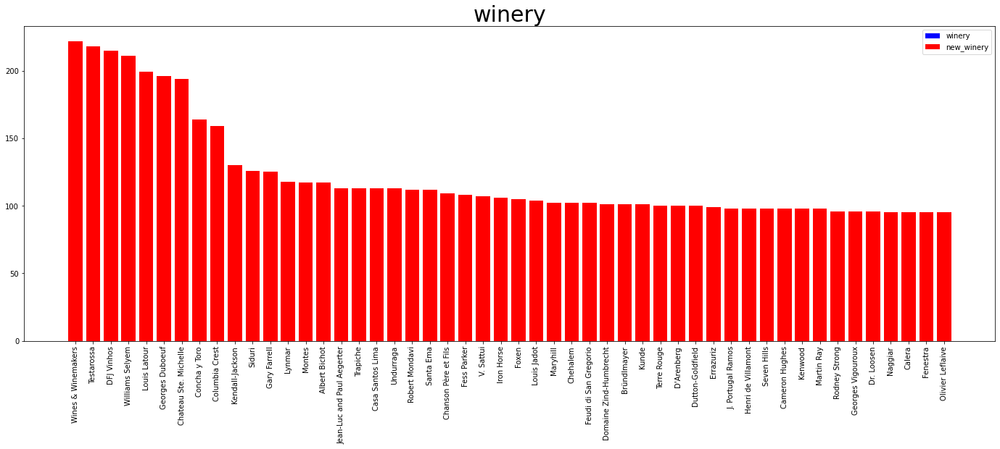

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000
Missing: 0

 new Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000 
 new Missing: 0 

descriptive statistics (price):
Min: 4.0000	Q1(25%): 17.0000 	Q2(50%): 25.0000 	Q3(75%): 42.0000 	Max: 3300.0000
Missing: 8996

 new Min: 4.0000	Q1(25%): 18.0000 	Q2(50%): 25.0000 	Q3(75%): 40.0000 	Max: 3300.0000 
 new Missing: 0 



/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


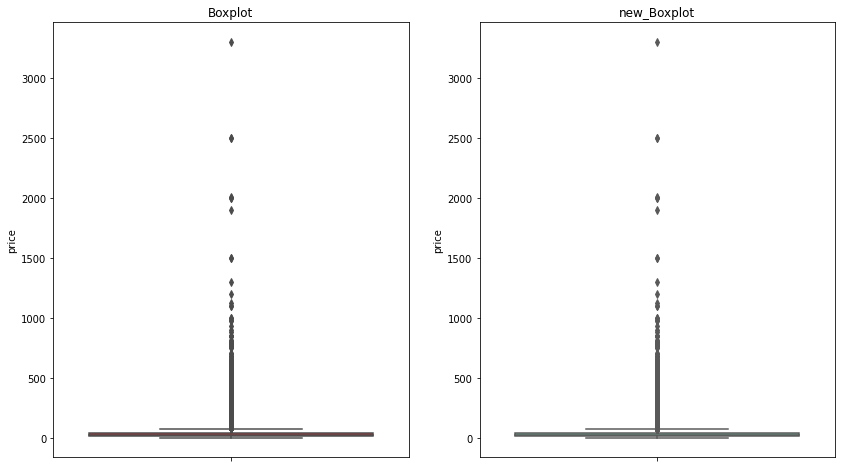

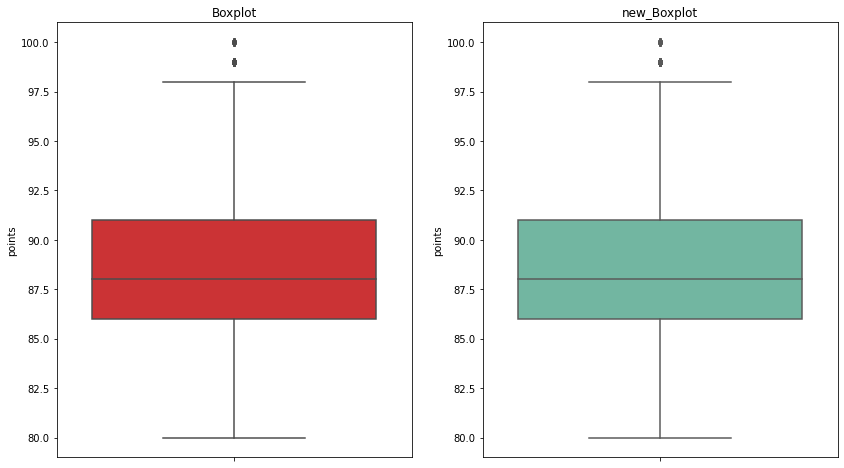

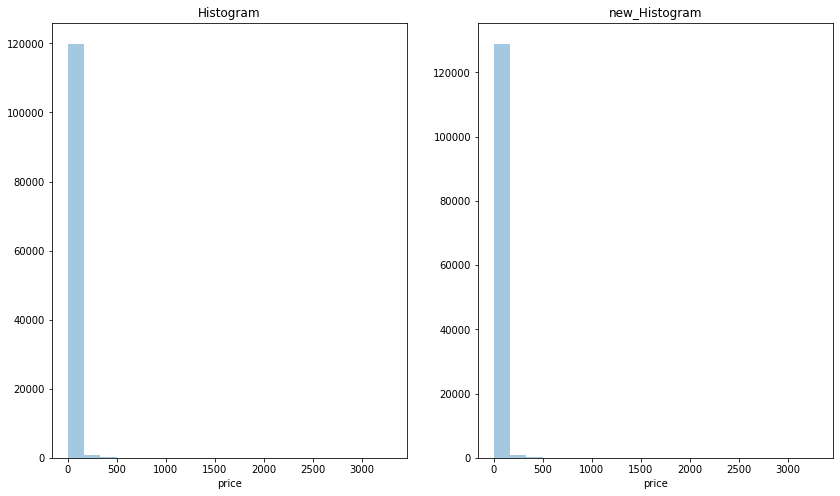

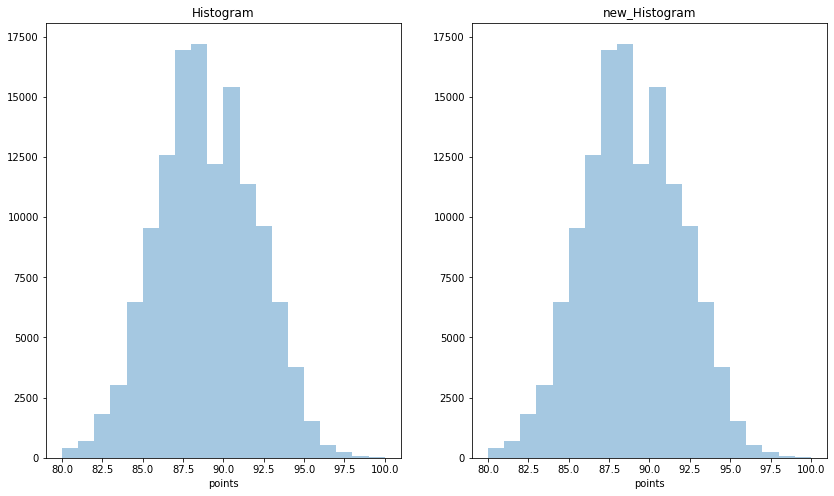

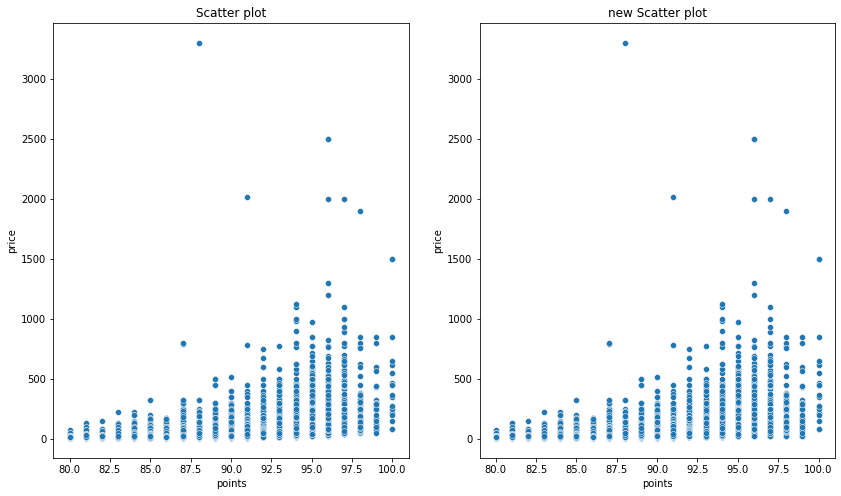

In [ ]:
md130k=miss_mode_fill(winemag130k)
columns_info(winemag130k,show_shape=True,new_df=md130k)
nominal_summary(winemag130k,nominal_index=nominal_index,head_n=50,new_df=md130k)
numerical_summary(winemag130k,numerical_index=numerical_index,new_df=md130k)
viz_pairs(winemag130k,xlabel='points',ylabel='price',bins=20,new_df=md130k)

3）通过属性的相关关系来填补缺失值

In [ ]:
miss_index=['country','designation','price','province','region_1','region_2','taster_name','taster_twitter_handle','variety']
comp_index=['description','points','title','winery']
att130k=attr_corr_fill(winemag130k,miss_index=miss_index,complete_index=comp_index)
columns_info(winemag130k,show_shape=True,new_df=att130k)
nominal_summary(winemag130k,nominal_index=nominal_index,head_n=50,new_df=att130k)
numerical_summary(winemag130k,numerical_index=numerical_index,new_df=att130k)
viz_pairs(winemag130k,xlabel='points',ylabel='price',bins=20,new_df=att130k)

KeyboardInterrupt: ignored

4）通过数据对象之间的相似性来填补缺失值

In [ ]:
obj130k=obj_corr_fill(winemag130k,numerical_index=numerical_index,k=10)
columns_info(winemag130k,show_shape=True,new_df=obj130k)
nominal_summary(winemag130k,nominal_index=nominal_index,head_n=50,new_df=obj130k)
numerical_summary(winemag130k,numerical_index=numerical_index,new_df=obj130k)
viz_pairs(winemag130k,xlabel='points',ylabel='price',bins=20,new_df=obj130k)

/usr/local/lib/python3.7/dist-packages/impyute/imputation/cs/fast_knn.py:113: RuntimeWarning: invalid value encountered in true_divide
  weights = distances/np.sum(distances)


KeyboardInterrupt: ignored

# **Chicago Building Violations数据集**
building-violations.csv

In [ ]:
building_violations_dir = "./Chicago_Building_Violations"
building_violations=pd.read_csv(building_violations_dir+"/building-violations.csv",sep=',',header='infer',index_col=None)

In [ ]:
columns_info(building_violations)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1677788 entries, 0 to 1677787
Data columns (total 32 columns):
 #   Column                        Non-Null Count    Dtype  
---  ------                        --------------    -----  
 0   ID                            1677788 non-null  int64  
 1   VIOLATION LAST MODIFIED DATE  1677788 non-null  object 
 2   VIOLATION DATE                1677788 non-null  object 
 3   VIOLATION CODE                1677788 non-null  object 
 4   VIOLATION STATUS              1677788 non-null  object 
 5   VIOLATION STATUS DATE         641589 non-null   object 
 6   VIOLATION DESCRIPTION         1667020 non-null  object 
 7   VIOLATION LOCATION            780506 non-null   object 
 8   VIOLATION INSPECTOR COMMENTS  1502325 non-null  object 
 9   VIOLATION ORDINANCE           1630207 non-null  object 
 10  INSPECTOR ID                  1677788 non-null  object 
 11  INSPECTION NUMBER             1677788 non-null  int64  
 12  INSPECTION STATUS           

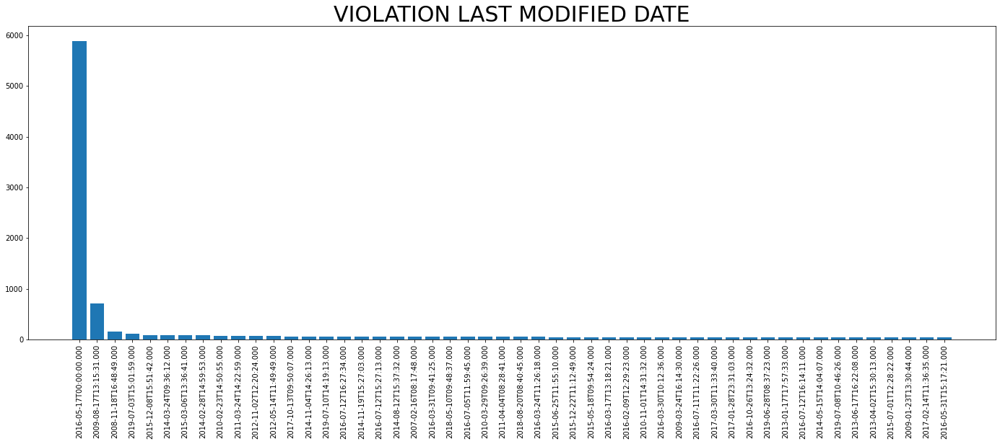

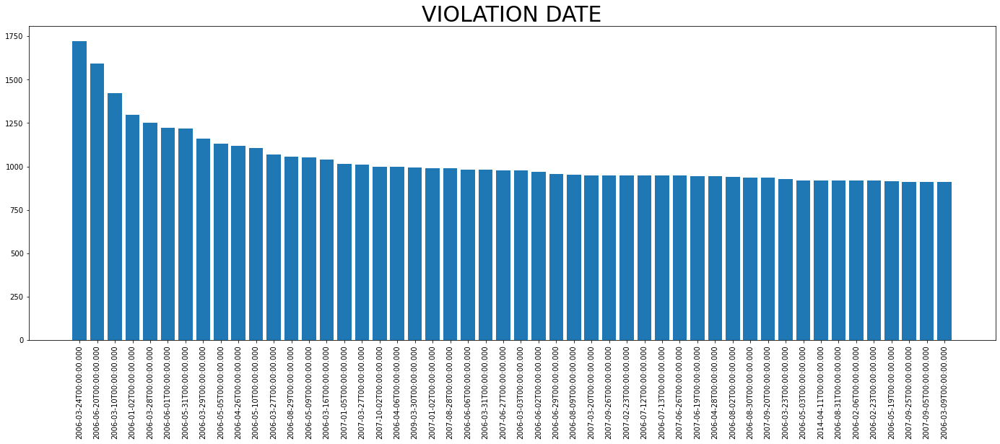

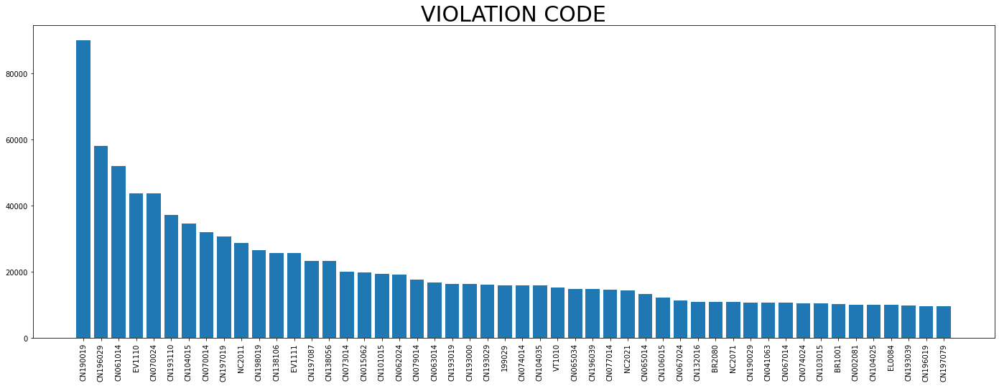

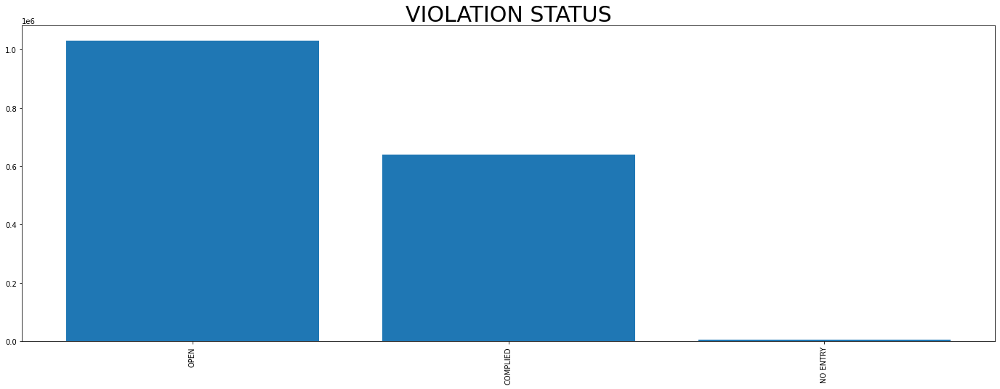

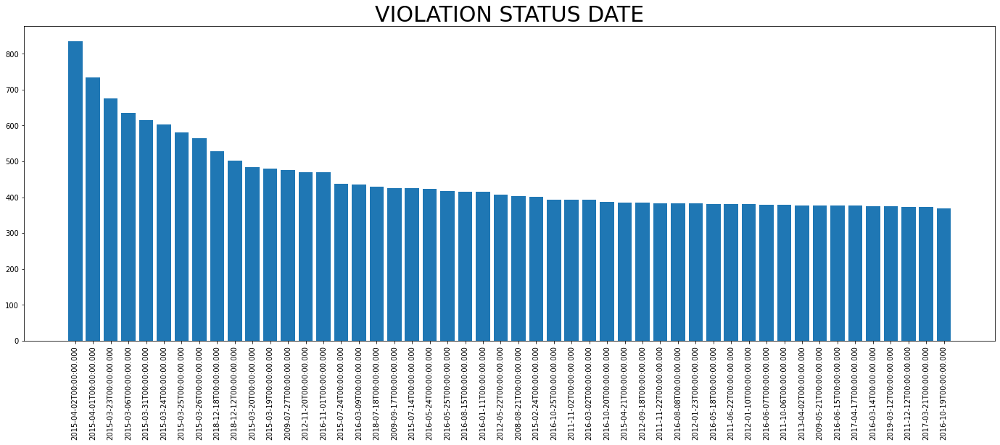

...

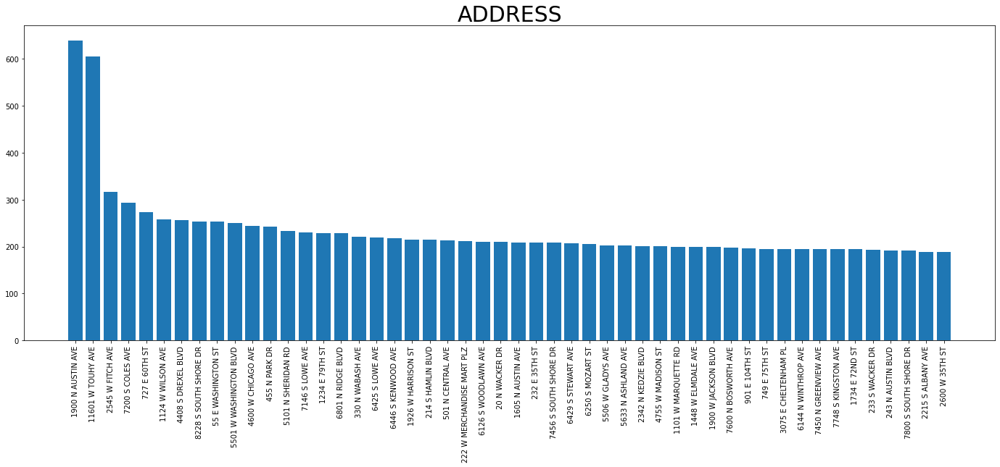

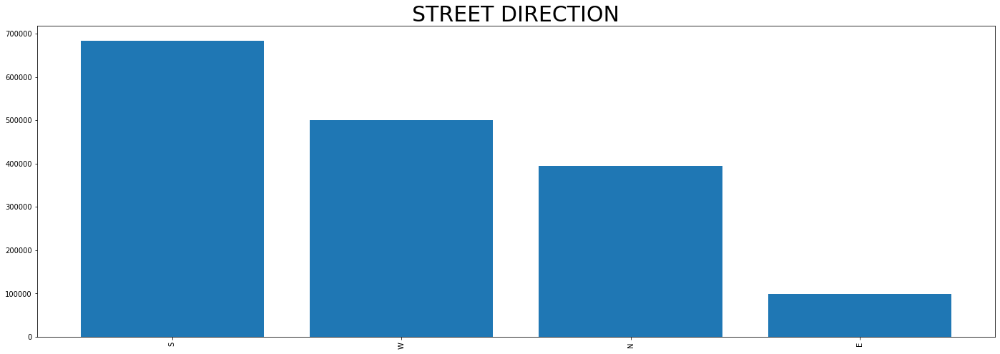

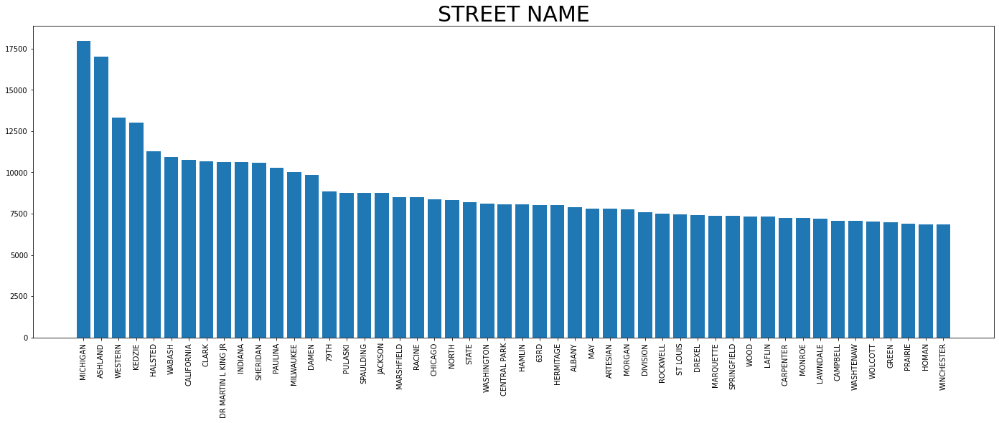

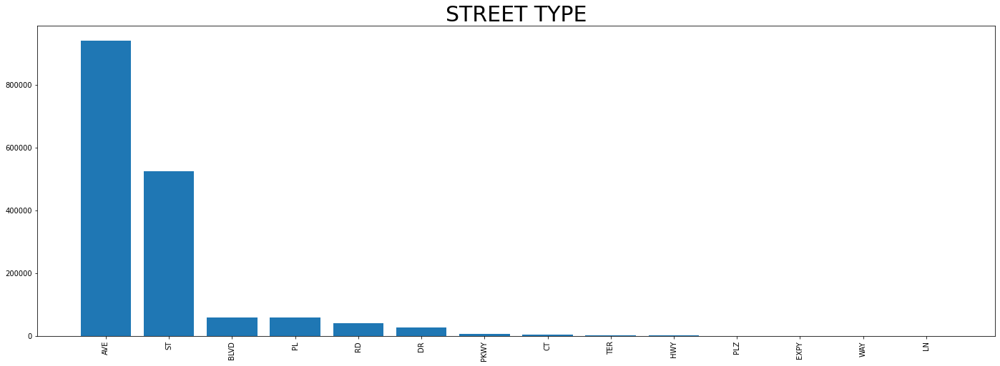

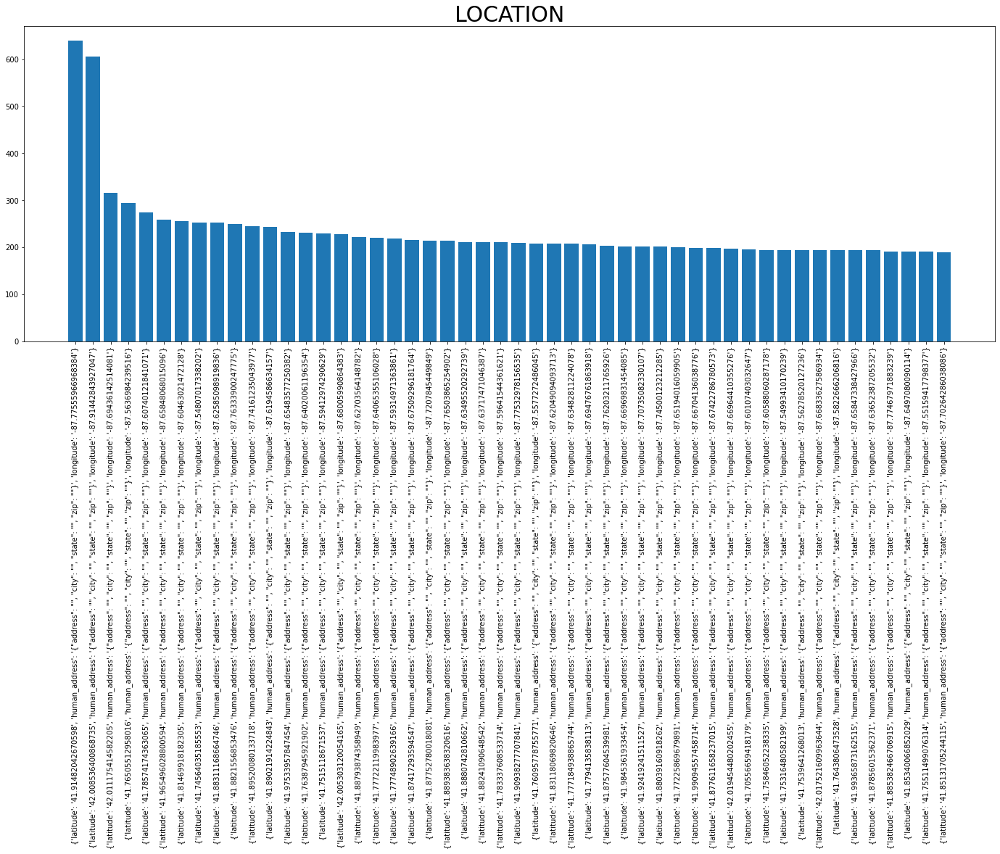

descriptive statistics (ID):
Min: 219970.0000	Q1(25%): 2838311.7500 	Q2(50%): 4168119.5000 	Q3(75%): 5320395.2500 	Max: 6392508.0000
Missing: 0

descriptive statistics (INSPECTION NUMBER):
Min: 265575.0000	Q1(25%): 2304416.0000 	Q2(50%): 10418746.0000 	Q3(75%): 11687280.0000 	Max: 13050915.0000
Missing: 0

descriptive statistics (STREET NUMBER):
Min: 1.0000	Q1(25%): 1648.0000 	Q2(50%): 3747.0000 	Q3(75%): 6228.0000 	Max: 13770.0000
Missing: 0

descriptive statistics (PROPERTY GROUP):
Min: 1000.0000	Q1(25%): 20560.0000 	Q2(50%): 154323.0000 	Q3(75%): 366984.0000 	Max: 677975.0000
Missing: 0

descriptive statistics (SSA):
Min: 1.0000	Q1(25%): 22.0000 	Q2(50%): 34.0000 	Q3(75%): 49.0000 	Max: 69.0000
Missing: 1356267

descriptive statistics (LATITUDE):
Min: 41.6447	Q1(25%): 41.7709 	Q2(50%): 41.8540 	Q3(75%): 41.9135 	Max: 42.0227
Missing: 1510

descriptive statistics (LONGITUDE):
Min: -87.9144	Q1(25%): -87.7139 	Q2(50%): -87.6699 	Q3(75%): -87.6329 	Max: -87.5247
Missing: 1510

descripti

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


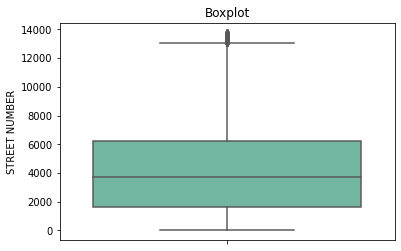

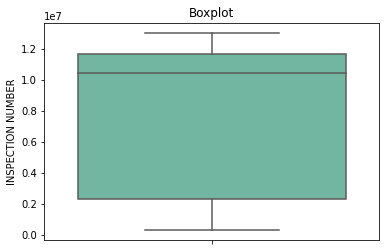

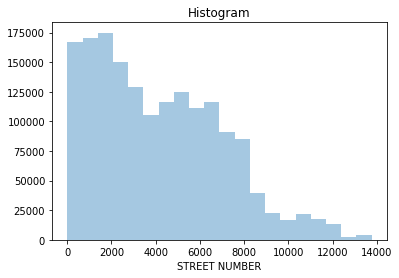

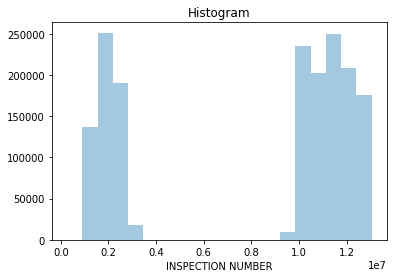

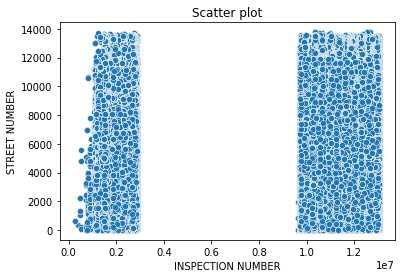

In [ ]:
# Nominal index
nominal_index = ['VIOLATION LAST MODIFIED DATE','VIOLATION DATE', 'VIOLATION CODE', 'VIOLATION STATUS', 'VIOLATION STATUS DATE', 'VIOLATION DESCRIPTION',
        'VIOLATION LOCATION', 'VIOLATION INSPECTOR COMMENTS','VIOLATION ORDINANCE','INSPECTOR ID','INSPECTION STATUS','INSPECTION WAIVED','INSPECTION CATEGORY',
        'DEPARTMENT BUREAU','ADDRESS','STREET DIRECTION','STREET NAME','STREET TYPE','LOCATION']
# Numerical index
numerical_index = ['ID','INSPECTION NUMBER', 'STREET NUMBER','PROPERTY GROUP','SSA','LATITUDE','LONGITUDE','Community Areas','Zip Codes','Boundaries - ZIP Codes','Census Tracts','Wards','Historical Wards 2003-2015']
nominal_summary(building_violations,new_df=None,nominal_index=nominal_index,head_n=50)
numerical_summary(building_violations,new_df=None,numerical_index=numerical_index)
viz_pairs(building_violations,xlabel=numerical_index[1],ylabel=numerical_index[2],bins=20,new_df=None)

**缺失值处理与对比**

1）将缺失值部分剔除

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1677788 entries, 0 to 1677787
Data columns (total 32 columns):
 #   Column                        Non-Null Count    Dtype  
---  ------                        --------------    -----  
 0   ID                            1677788 non-null  int64  
 1   VIOLATION LAST MODIFIED DATE  1677788 non-null  object 
 2   VIOLATION DATE                1677788 non-null  object 
 3   VIOLATION CODE                1677788 non-null  object 
 4   VIOLATION STATUS              1677788 non-null  object 
 5   VIOLATION STATUS DATE         641589 non-null   object 
 6   VIOLATION DESCRIPTION         1667020 non-null  object 
 7   VIOLATION LOCATION            780506 non-null   object 
 8   VIOLATION INSPECTOR COMMENTS  1502325 non-null  object 
 9   VIOLATION ORDINANCE           1630207 non-null  object 
 10  INSPECTOR ID                  1677788 non-null  object 
 11  INSPECTION NUMBER             1677788 non-null  int64  
 12  INSPECTION STATUS           

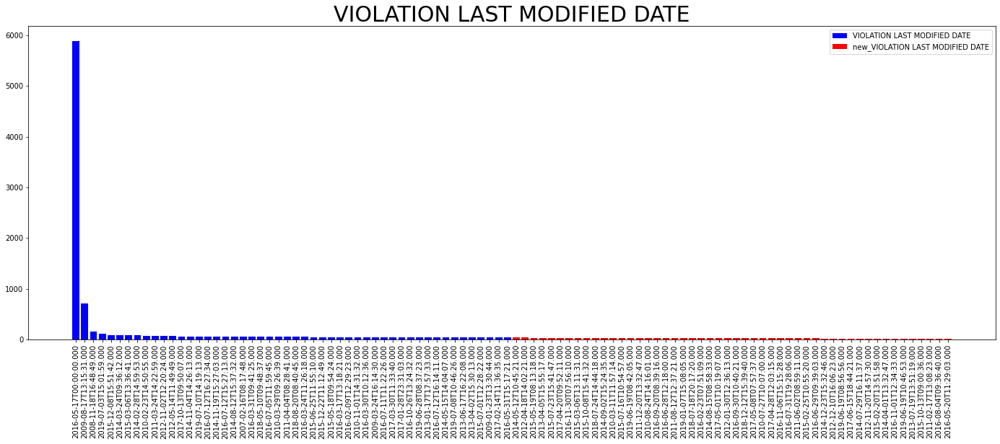

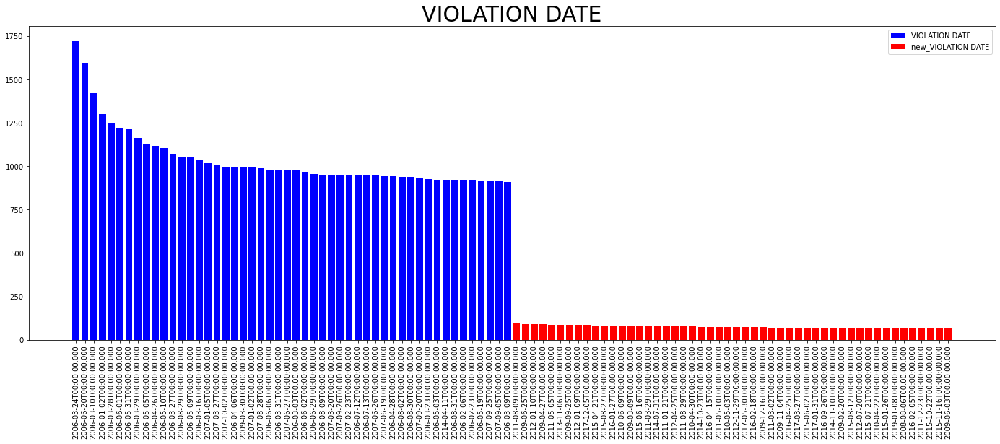

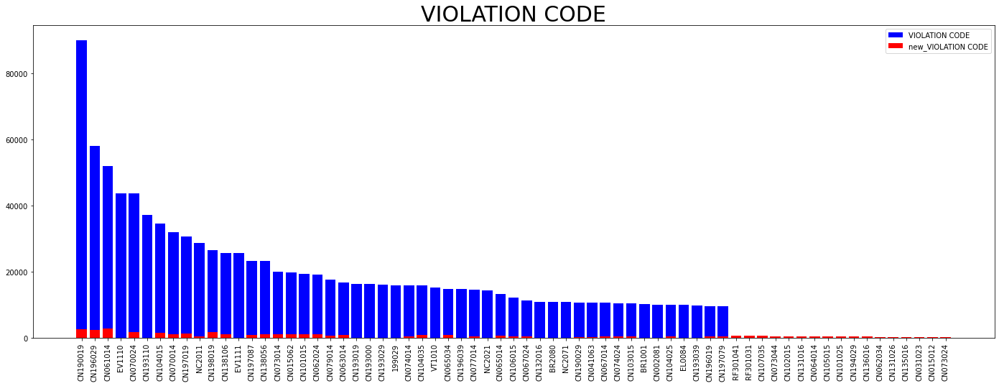

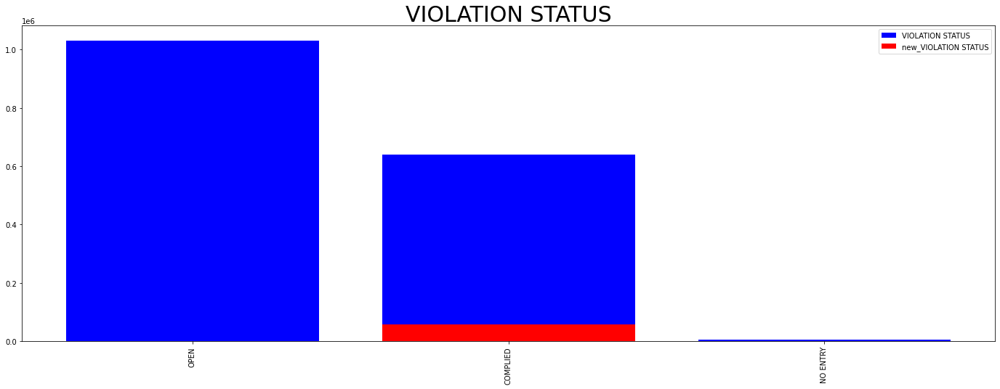

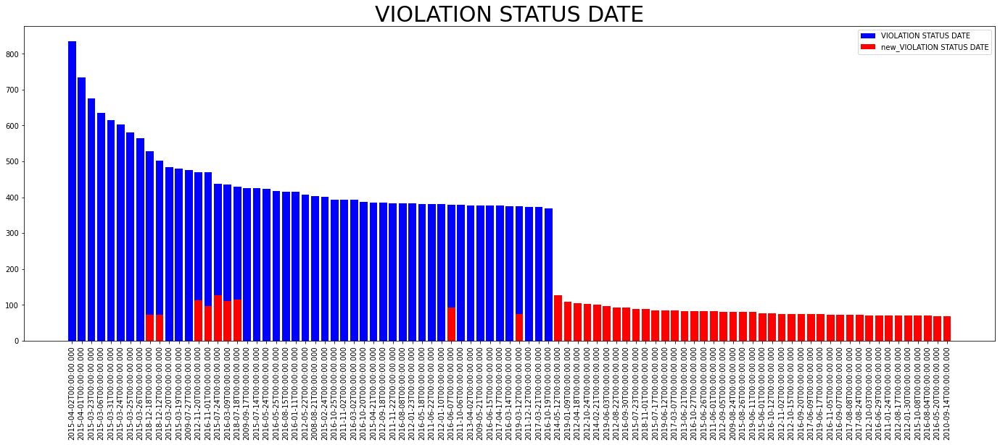

...

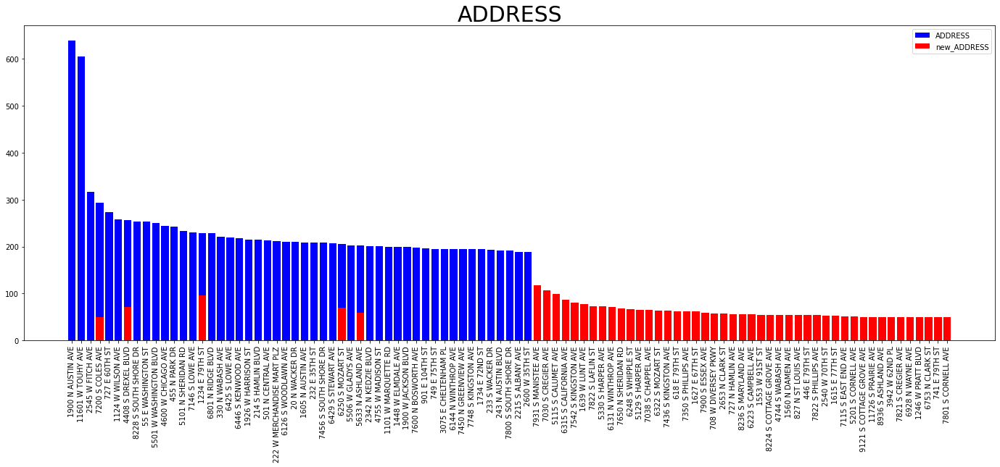

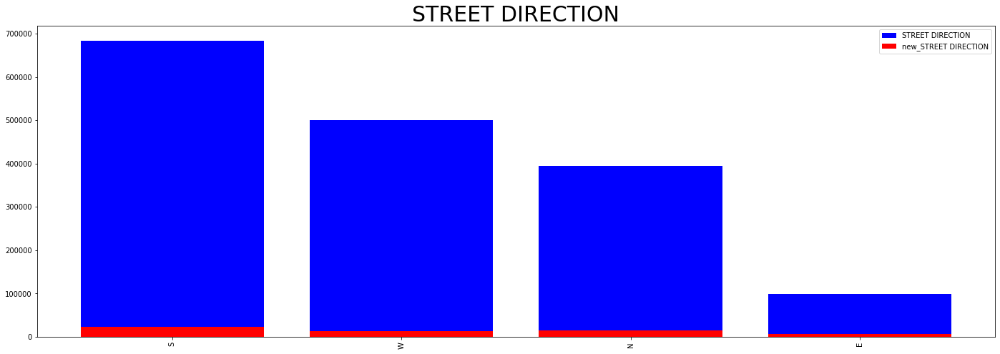

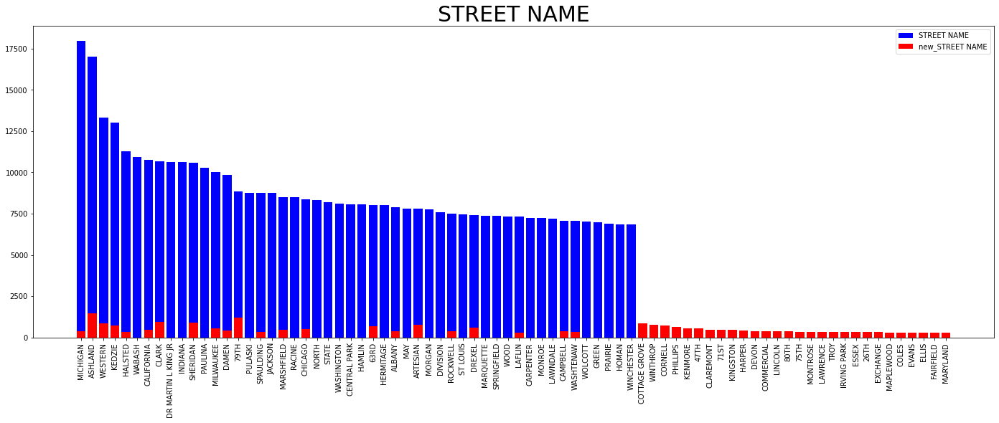

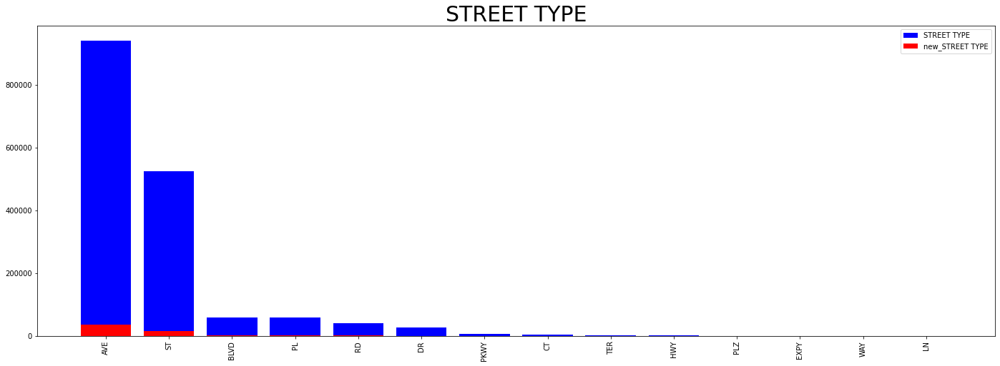

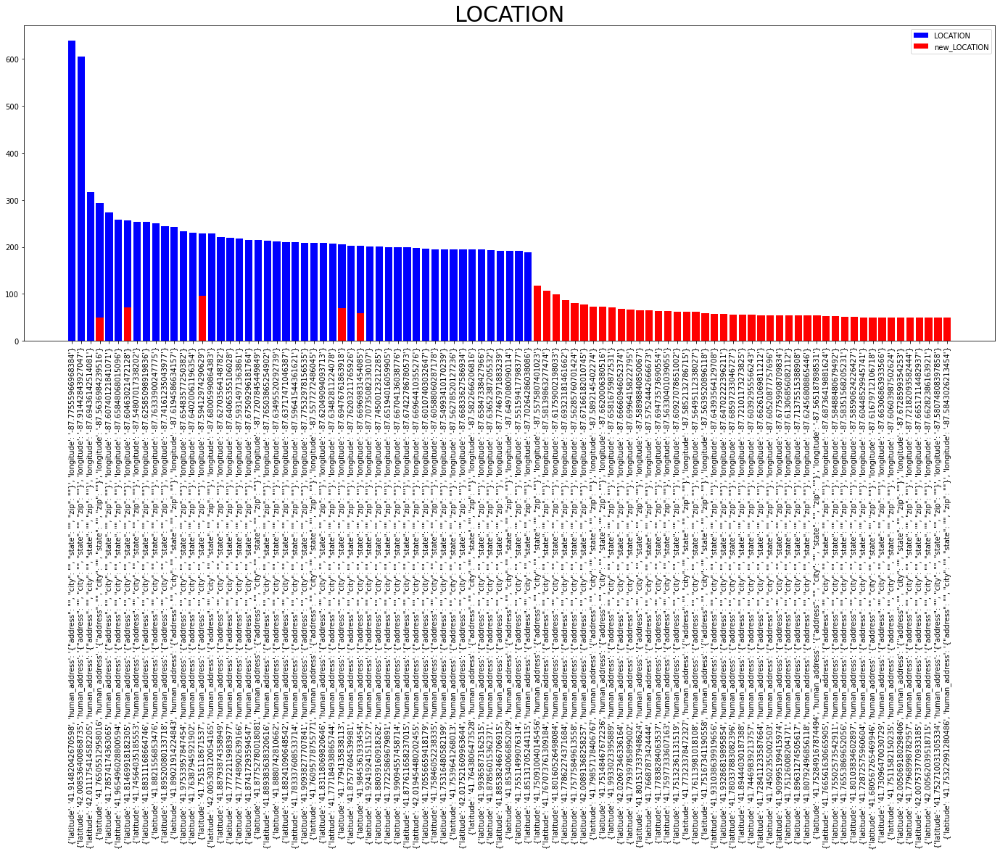

descriptive statistics (ID):
Min: 219970.0000	Q1(25%): 2838311.7500 	Q2(50%): 4168119.5000 	Q3(75%): 5320395.2500 	Max: 6392508.0000
Missing: 0

 new Min: 972515.0000	Q1(25%): 3715265.0000 	Q2(50%): 4331178.0000 	Q3(75%): 5321485.5000 	Max: 6375022.0000 
 new Missing: 1620185 

descriptive statistics (INSPECTION NUMBER):
Min: 265575.0000	Q1(25%): 2304416.0000 	Q2(50%): 10418746.0000 	Q3(75%): 11687280.0000 	Max: 13050915.0000
Missing: 0

 new Min: 1061448.0000	Q1(25%): 9929462.0000 	Q2(50%): 10707030.0000 	Q3(75%): 11716234.0000 	Max: 13035353.0000 
 new Missing: 1620185 

descriptive statistics (STREET NUMBER):
Min: 1.0000	Q1(25%): 1648.0000 	Q2(50%): 3747.0000 	Q3(75%): 6228.0000 	Max: 13770.0000
Missing: 0

 new Min: 1.0000	Q1(25%): 1758.0000 	Q2(50%): 4431.0000 	Q3(75%): 7025.0000 	Max: 11750.0000 
 new Missing: 1620185 

descriptive statistics (PROPERTY GROUP):
Min: 1000.0000	Q1(25%): 20560.0000 	Q2(50%): 154323.0000 	Q3(75%): 366984.0000 	Max: 677975.0000
Missing: 0

 new Min: 10

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


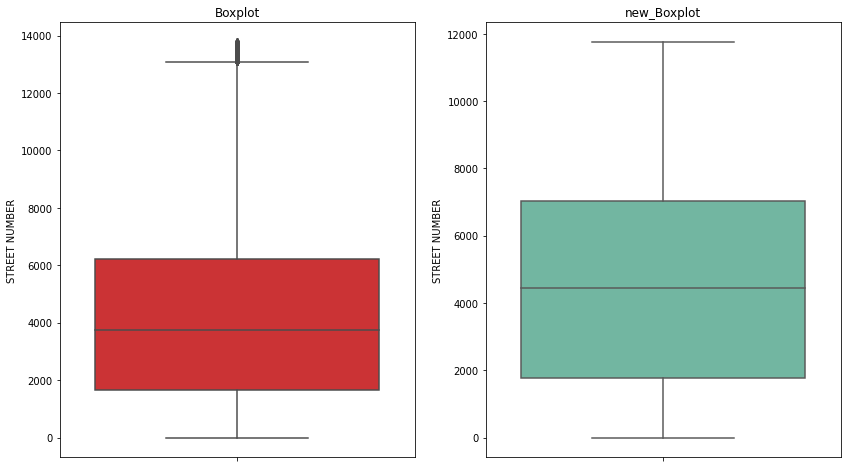

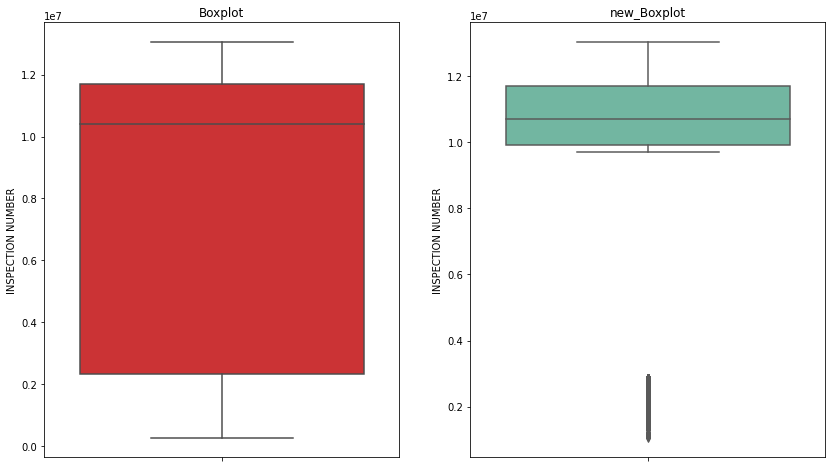

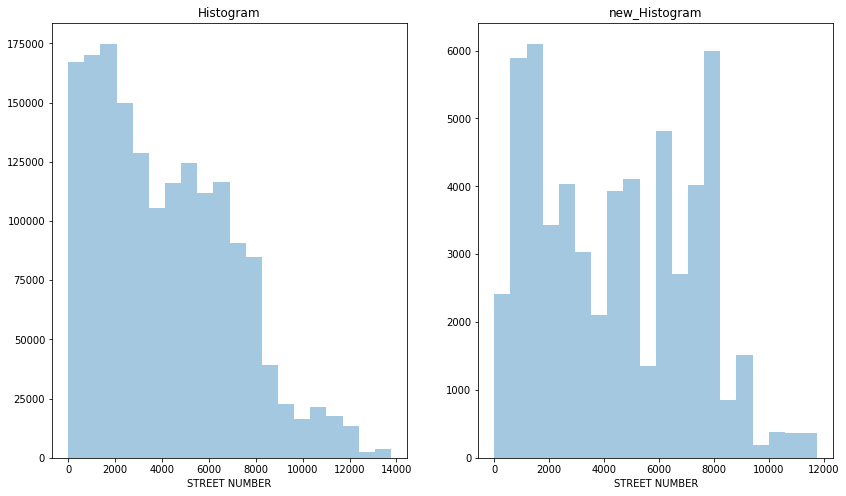

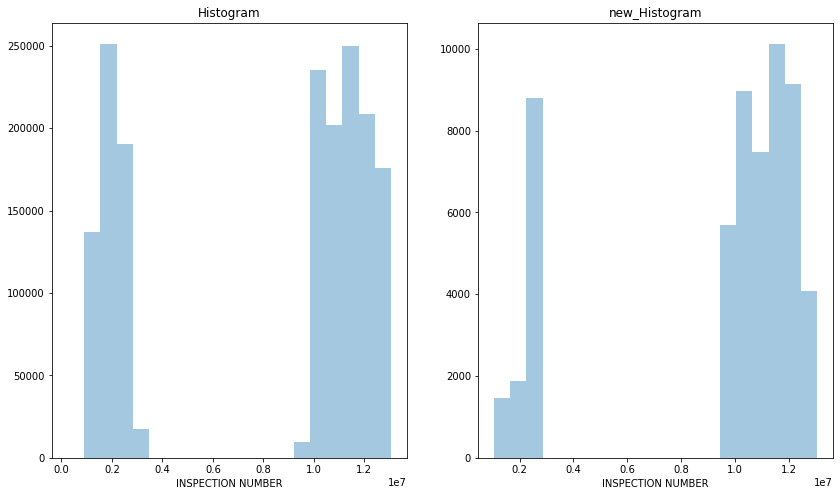

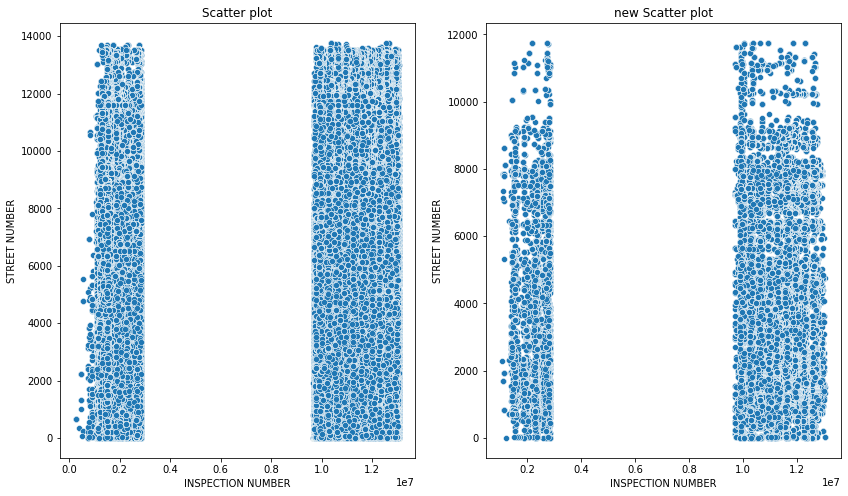

In [ ]:
dwbv=miss_drop(building_violations)
columns_info(building_violations,show_shape=True,new_df=dwbv)
nominal_summary(building_violations,nominal_index=nominal_index,head_n=50,new_df=dwbv)
numerical_summary(building_violations,numerical_index=numerical_index,new_df=dwbv)
viz_pairs(building_violations,xlabel=numerical_index[1],ylabel=numerical_index[2],bins=20,new_df=dwbv)

2）用最高频率值来填补缺失值

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1677788 entries, 0 to 1677787
Data columns (total 32 columns):
 #   Column                        Non-Null Count    Dtype  
---  ------                        --------------    -----  
 0   ID                            1677788 non-null  int64  
 1   VIOLATION LAST MODIFIED DATE  1677788 non-null  object 
 2   VIOLATION DATE                1677788 non-null  object 
 3   VIOLATION CODE                1677788 non-null  object 
 4   VIOLATION STATUS              1677788 non-null  object 
 5   VIOLATION STATUS DATE         641589 non-null   object 
 6   VIOLATION DESCRIPTION         1667020 non-null  object 
 7   VIOLATION LOCATION            780506 non-null   object 
 8   VIOLATION INSPECTOR COMMENTS  1502325 non-null  object 
 9   VIOLATION ORDINANCE           1630207 non-null  object 
 10  INSPECTOR ID                  1677788 non-null  object 
 11  INSPECTION NUMBER             1677788 non-null  int64  
 12  INSPECTION STATUS           

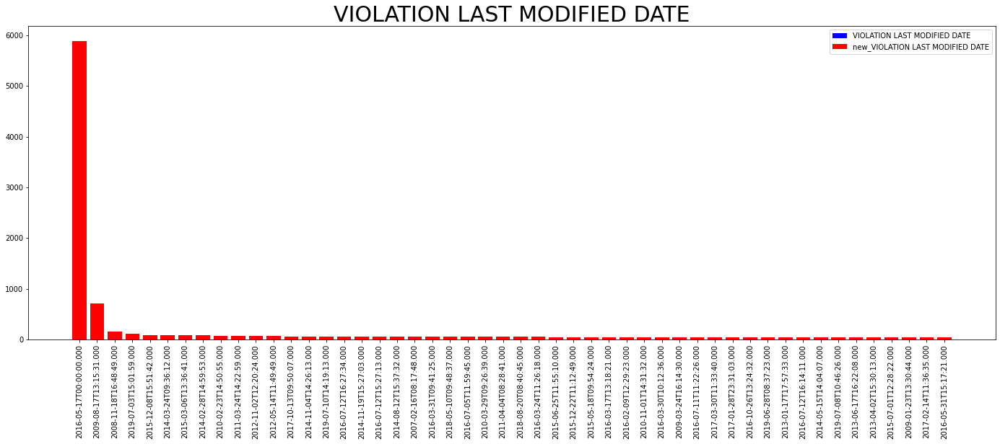

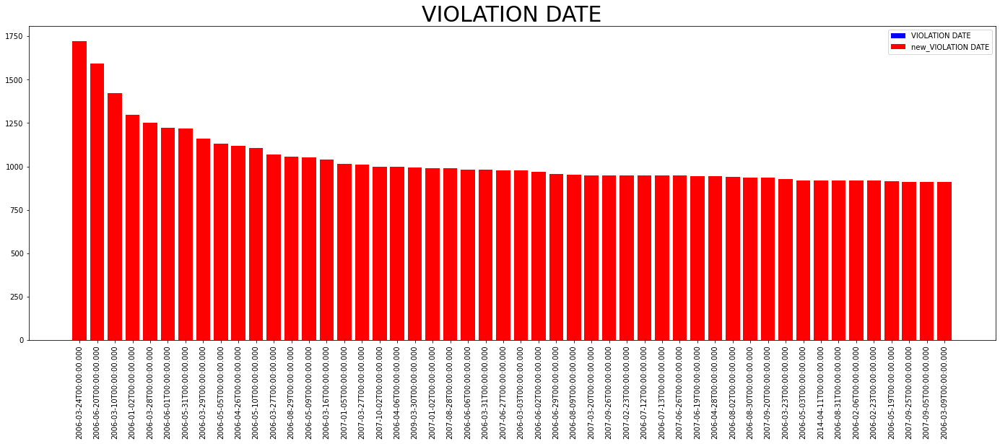

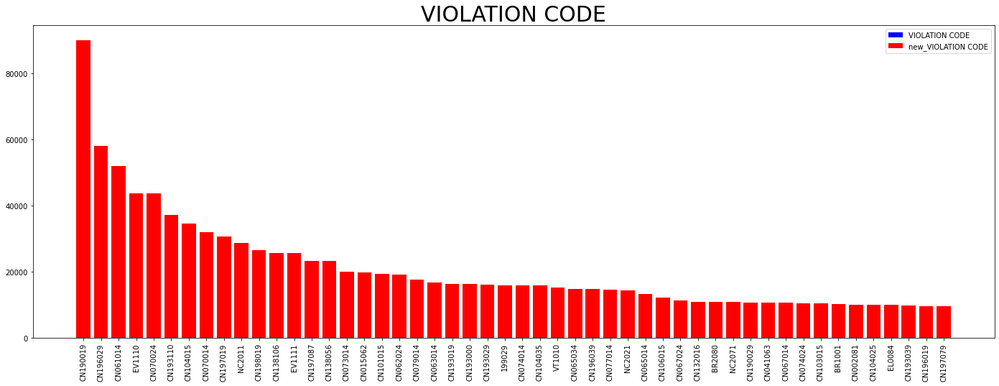

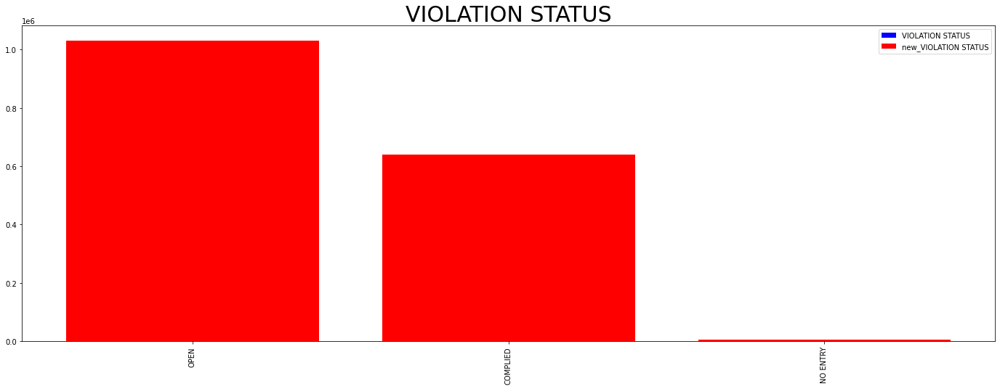

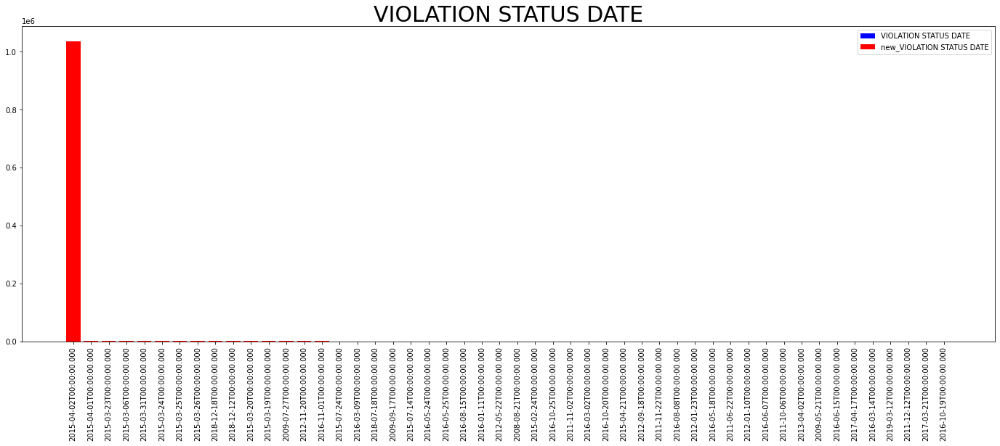

...

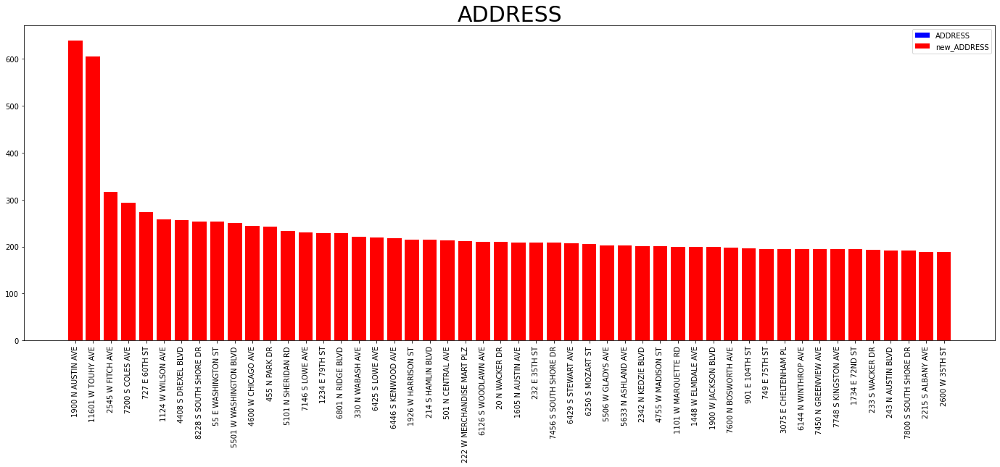

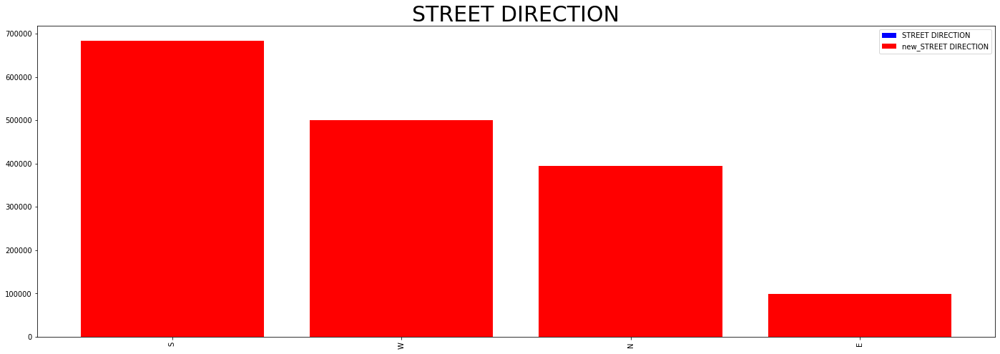

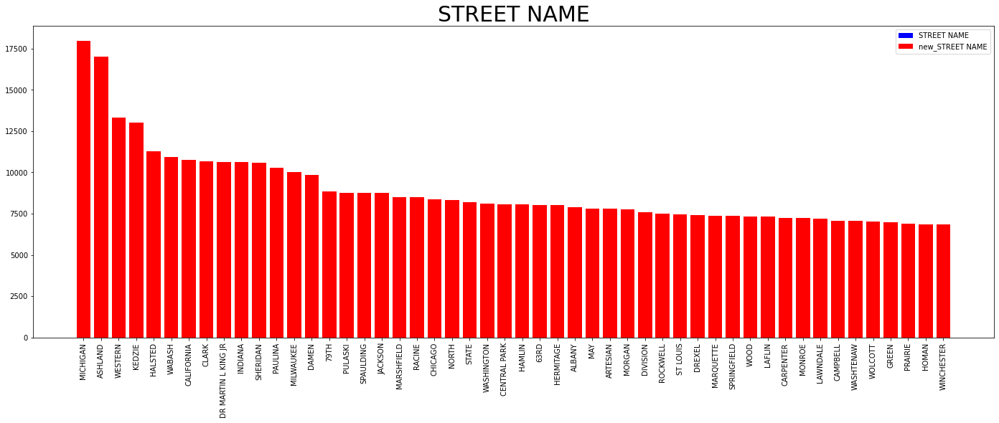

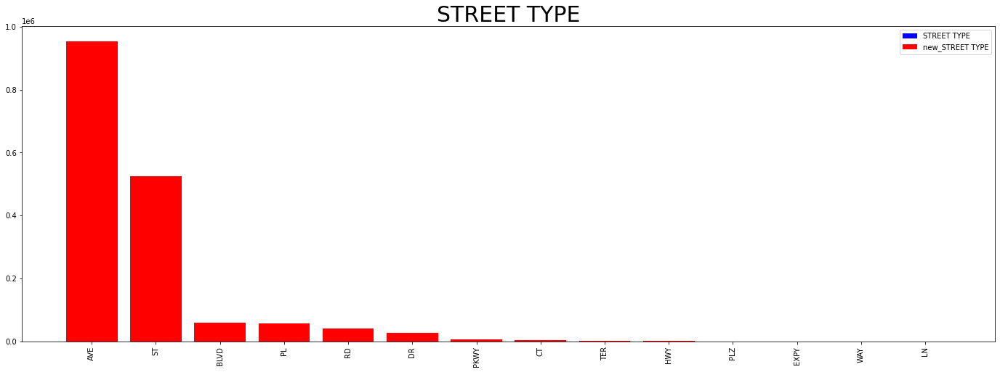

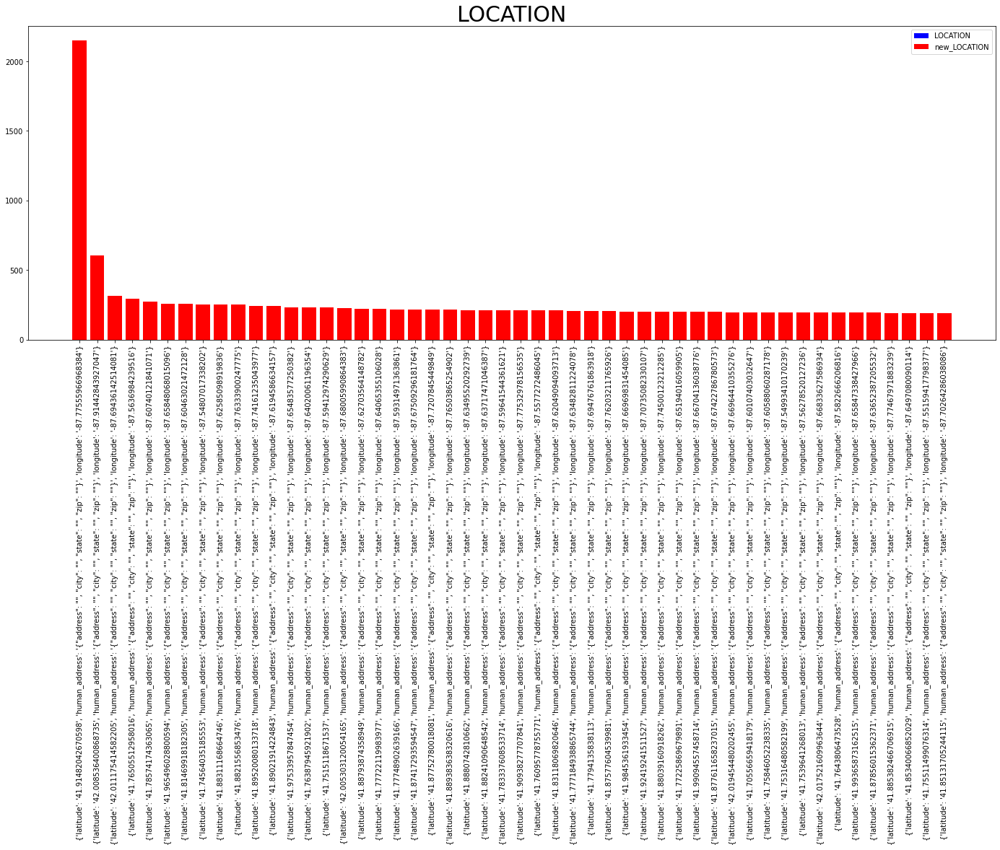

descriptive statistics (ID):
Min: 219970.0000	Q1(25%): 2838311.7500 	Q2(50%): 4168119.5000 	Q3(75%): 5320395.2500 	Max: 6392508.0000
Missing: 0

 new Min: 219970.0000	Q1(25%): 2838311.7500 	Q2(50%): 4168119.5000 	Q3(75%): 5320395.2500 	Max: 6392508.0000 
 new Missing: 0 

descriptive statistics (INSPECTION NUMBER):
Min: 265575.0000	Q1(25%): 2304416.0000 	Q2(50%): 10418746.0000 	Q3(75%): 11687280.0000 	Max: 13050915.0000
Missing: 0

 new Min: 265575.0000	Q1(25%): 2304416.0000 	Q2(50%): 10418746.0000 	Q3(75%): 11687280.0000 	Max: 13050915.0000 
 new Missing: 0 

descriptive statistics (STREET NUMBER):
Min: 1.0000	Q1(25%): 1648.0000 	Q2(50%): 3747.0000 	Q3(75%): 6228.0000 	Max: 13770.0000
Missing: 0

 new Min: 1.0000	Q1(25%): 1648.0000 	Q2(50%): 3747.0000 	Q3(75%): 6228.0000 	Max: 13770.0000 
 new Missing: 0 

descriptive statistics (PROPERTY GROUP):
Min: 1000.0000	Q1(25%): 20560.0000 	Q2(50%): 154323.0000 	Q3(75%): 366984.0000 	Max: 677975.0000
Missing: 0

 new Min: 1000.0000	Q1(25%): 20

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


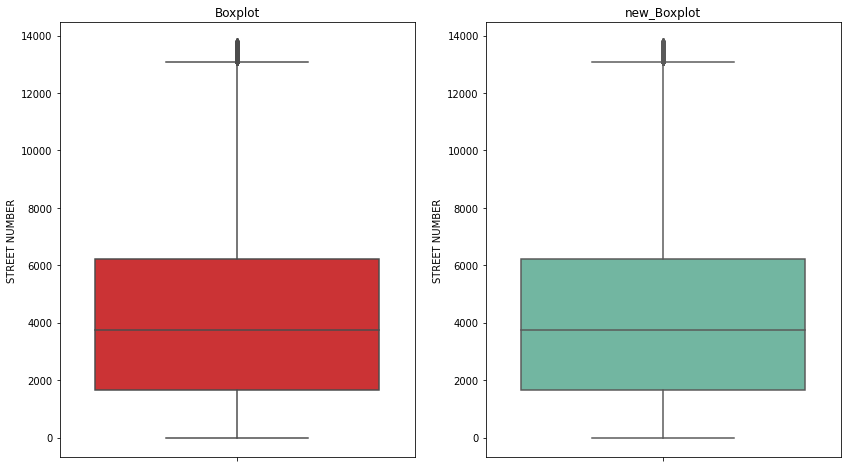

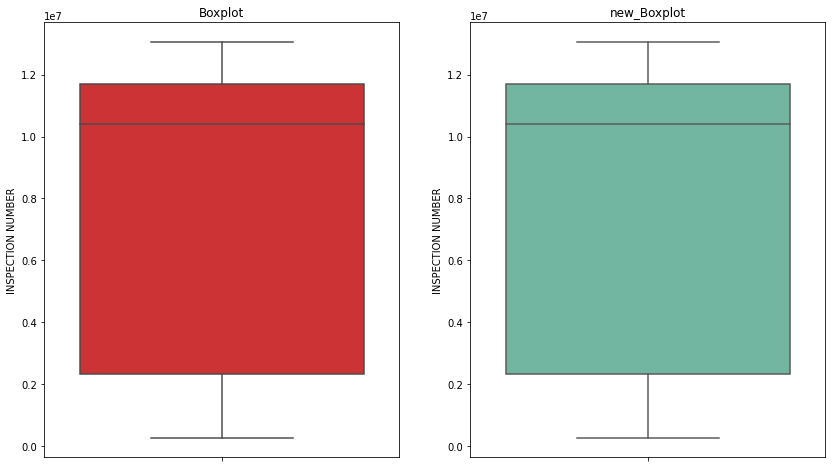

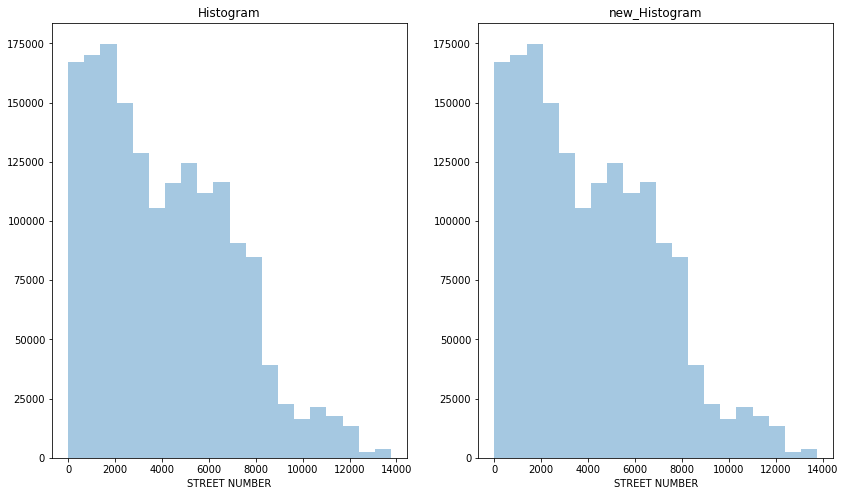

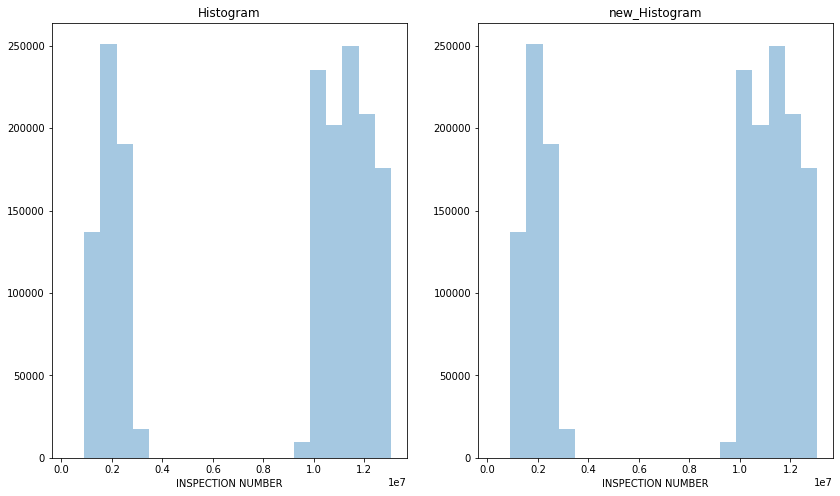

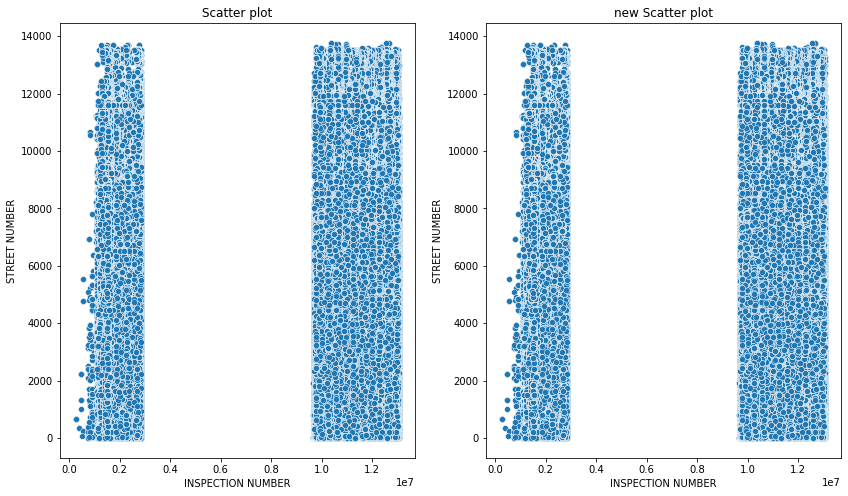

In [ ]:
mdbv=miss_mode_fill(building_violations)
columns_info(building_violations,show_shape=True,new_df=mdbv)
nominal_summary(building_violations,nominal_index=nominal_index,head_n=50,new_df=mdbv)
numerical_summary(building_violations,numerical_index=numerical_index,new_df=mdbv)
viz_pairs(building_violations,xlabel=numerical_index[1],ylabel=numerical_index[2],bins=20,new_df=mdbv)

3）通过属性的相关关系来填补缺失值

In [ ]:
miss_index=['VIOLATION STATUS DATE','VIOLATION DESCRIPTION','VIOLATION LOCATION','VIOLATION INSPECTOR COMMENTS','VIOLATION ORDINANCE','INSPECTION STATUS',
            'STREET TYPE','SSA','LATITUDE','LONGITUDE','LOCATION','Community Areas','Zip Codes','Boundaries - ZIP Codes','Census Tracts','Wards',
            'Historical Wards 2003-2015']
comp_index=['ID','VIOLATION LAST MODIFIED DATE','VIOLATION DATE','VIOLATION CODE','VIOLATION STATUS','INSPECTOR ID','INSPECTION NUMBER','INSPECTION WAIVED',
            'INSPECTION CATEGORY','DEPARTMENT BUREAU','ADDRESS','STREET NUMBER','STREET DIRECTION','STREET NAME','PROPERTY GROUP']
attbv=attr_corr_fill(building_violations,miss_index=miss_index,complete_index=comp_index)
columns_info(building_violations,show_shape=True,new_df=attbv)
nominal_summary(building_violations,nominal_index=nominal_index,head_n=50,new_df=attbv)
numerical_summary(building_violations,numerical_index=numerical_index,new_df=attbv)
viz_pairs(building_violations,xlabel=numerical_index[1],ylabel=numerical_index[2],bins=20,new_df=attbv)

KeyboardInterrupt: ignored

4）通过数据对象之间的相似性来填补缺失值

In [ ]:
objbv=obj_corr_fill(building_violations,numerical_index=numerical_index,k=10)
columns_info(building_violations,show_shape=True,new_df=objbv)
nominal_summary(building_violations,nominal_index=nominal_index,head_n=50,new_df=objbv)
numerical_summary(building_violations,numerical_index=numerical_index,new_df=objbv)
viz_pairs(building_violations,xlabel=numerical_index[1],ylabel=numerical_index[2],bins=20,new_df=objbv)